In [ ]:
#Imports
from os import listdir
from os.path import isfile, join
from collections import Counter
import re
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV, cross_val_predict
from sklearn.ensemble import RandomForestRegressor, IsolationForest
from sklearn.linear_model import LinearRegression
from sklearn.svm import OneClassSVM

In [ ]:
%cd /content/drive/MyDrive/VIU/14MBID/
#!ls

/content/drive/MyDrive/VIU/14MBID


# 1 Import initial preprocessed data

In [ ]:
#del (df, data)
files = ["20230317TransformedData.csv", "20230319TransformedData.csv", "20230320TransformedData.csv", "20230321TransformedData.csv", "20230322TransformedData.csv", "20230326TransformedData.csv"\
         , "20230327TransformedData.csv", "20230328TransformedData.csv", "20230329TransformedData.csv", "20230330TransformedData.csv", "20230331TransformedData.csv", "20230401TransformedData.csv"\
         , "20230402TransformedData.csv", "20230403TransformedData.csv", "20230404TransformedData.csv", "20230405TransformedData.csv", "20230406TransformedData.csv", "20230407TransformedData.csv"\
         , "20230408TransformedData.csv", "20230409TransformedData.csv", "20230410TransformedData.csv", "20230411TransformedData.csv", "20230412TransformedData.csv", "20230413TransformedData.csv"]
# Initialize an empty DataFrame
data = pd.DataFrame()

for file in files:
  df =  pd.read_csv(file, sep='\t')
  if data.empty:
    data = df
  else:
    data = pd.concat([data, df], ignore_index=True)

# Reset the index for a new continuous index in the concatenated DataFrame
data.reset_index(drop=True, inplace=True)

print(data.shape)
data.tail()

(4999986, 33)


,Unnamed: 0,ID,Date,Time,MotorTemperature,BrakeTemperature,Config,Process,CurveProcess,TimeLength,...,Torque1Q2,Torque1Q3,Torque1Max,BrakeCMDForceMean,BrakeCMDForceStd,BrakeCMDForceMin,BrakeCMDForceQ1,BrakeCMDForceQ2,BrakeCMDForceQ3,BrakeCMDForceMax
4999981,161407,1144814,2023-04-13,0 days 02:03:48,87.43,69.38,P47_S63_A21000_BF2,BF2,top,606,...,0.77,0.84,1.25,1654.785479,199.259464,1600.0,1600.0,1600.0,1600.0,2400.0
4999982,161408,1144814,2023-04-13,0 days 02:03:48,87.43,69.38,P47_S63_A21000_BF2,BF2,decceleration,185,...,0.77,0.84,1.25,1654.785479,199.259464,1600.0,1600.0,1600.0,1600.0,2400.0
4999983,161409,1144820,2023-04-13,0 days 02:03:54,87.72,69.35,P47_S63_A21000_BF2,BF2,acceleration,150,...,1.45,1.76,2.67,1560.000000,481.608045,600.0,1800.0,1800.0,1800.0,1800.0
4999984,161410,1144820,2023-04-13,0 days 02:03:54,87.72,69.35,P47_S63_A21000_BF2,BF2,top,606,...,0.77,0.88,1.25,1655.775578,201.460721,1600.0,1600.0,1600.0,1600.0,2400.0
4999985,161411,1144820,2023-04-13,0 days 02:03:54,87.72,69.35,P47_S63_A21000_BF2,BF2,decceleration,170,...,0.77,0.88,1.25,1655.775578,201.460721,1600.0,1600.0,1600.0,1600.0,2400.0


In [ ]:
backupData = data

In [ ]:
#data = backupData

In [ ]:
data.head()

,Unnamed: 0,ID,Date,Time,MotorTemperature,BrakeTemperature,Config,Process,CurveProcess,TimeLength,...,Torque1Q2,Torque1Q3,Torque1Max,BrakeCMDForceMean,BrakeCMDForceStd,BrakeCMDForceMin,BrakeCMDForceQ1,BrakeCMDForceQ2,BrakeCMDForceQ3,BrakeCMDForceMax
0,0,10005,2023-03-17,0 days 12:56:54,100.32,68.58,P-47_S63_A21000_BF5,BF5,acceleration,150,...,-1.99,-1.3275,0.03,1692.000000,581.887694,600.0,2000.0,2000.0,2000.0,2000.0
1,1,10005,2023-03-17,0 days 12:56:54,100.32,68.58,P-47_S63_A21000_BF5,BF5,top,606,...,-0.77,-0.7400,-0.57,1551.155116,179.596386,1500.0,1500.0,1500.0,1500.0,2200.0
2,2,10005,2023-03-17,0 days 12:56:54,100.32,68.58,P-47_S63_A21000_BF5,BF5,decceleration,171,...,-0.77,-0.7400,-0.57,1551.155116,179.596386,1500.0,1500.0,1500.0,1500.0,2200.0
3,3,10011,2023-03-17,0 days 12:57:00,100.45,68.58,P-47_S63_A21000_BF5,BF5,acceleration,150,...,-1.94,-1.4200,0.00,1682.666667,588.108864,600.0,2000.0,2000.0,2000.0,2000.0
4,4,10011,2023-03-17,0 days 12:57:00,100.45,68.58,P-47_S63_A21000_BF5,BF5,top,606,...,-0.77,-0.7400,-0.57,1550.000000,177.656926,1500.0,1500.0,1500.0,1500.0,2200.0


In [ ]:
data.columns

Index(['Unnamed: 0', 'ID', 'Date', 'Time', 'MotorTemperature',
       'BrakeTemperature', 'Config', 'Process', 'CurveProcess', 'TimeLength',
       'PositionInit', 'PositionLength', 'Speed1Mean', 'Speed1Std',
       'Speed1Min', 'Speed1Q1', 'Speed1Q2', 'Speed1Q3', 'Speed1Max',
       'Torque1Mean', 'Torque1Std', 'Torque1Min', 'Torque1Q1', 'Torque1Q2',
       'Torque1Q3', 'Torque1Max', 'BrakeCMDForceMean', 'BrakeCMDForceStd',
       'BrakeCMDForceMin', 'BrakeCMDForceQ1', 'BrakeCMDForceQ2',
       'BrakeCMDForceQ3', 'BrakeCMDForceMax'],
      dtype='object')

## 1.1. Date

First we check the date of our data.

In [ ]:
print ("Data is between: ", data['Date'].min(), " and: ", data['Date'].max())
print ("Time is between: ", data['Time'].min(), " and: ", data['Time'].max())

Data is between:  2023-03-17  and:  2023-04-13
Time is between:  0 days 00:00:00  and:  0 days 23:59:59


In [ ]:
#print(data.dtypes)
print(data['Date'].dtype)
print(data['Time'].dtype)

object
object


Adding a datetime column to ensure the rows are ordered based on time

In [ ]:
data['Date'] = pd.to_datetime(data['Date'])
data['Time'] = pd.to_timedelta(data['Time'])
print(data['Date'].dtype)
print(data['Time'].dtype)

datetime64[ns]
timedelta64[ns]


In [ ]:
# Create a new column "Datetime" by combining "Date" and "Time"
data['Datetime'] = data['Date'] + data['Time']

# Sort the DataFrame based on the "Datetime" column
data = data.sort_values('Datetime')
data.reset_index(drop=True, inplace=True)

We use visualization to discover potential outliers.



<Axes: >

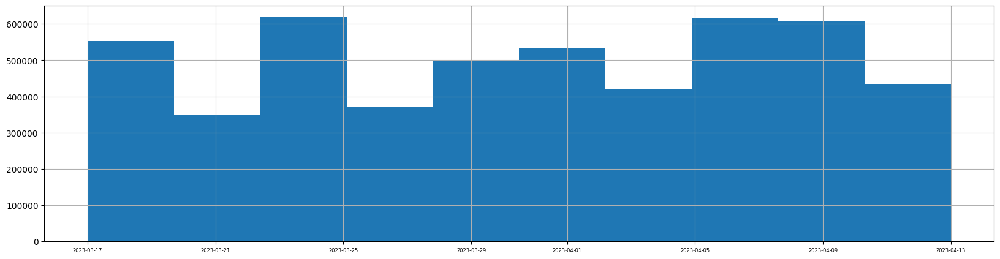

In [ ]:
data['Date'].hist(bins=10, xlabelsize=6, figsize=(20,5))

In [ ]:
data.columns

Index(['Unnamed: 0', 'ID', 'Date', 'Time', 'MotorTemperature',
       'BrakeTemperature', 'Config', 'Process', 'CurveProcess', 'TimeLength',
       'PositionInit', 'PositionLength', 'Speed1Mean', 'Speed1Std',
       'Speed1Min', 'Speed1Q1', 'Speed1Q2', 'Speed1Q3', 'Speed1Max',
       'Torque1Mean', 'Torque1Std', 'Torque1Min', 'Torque1Q1', 'Torque1Q2',
       'Torque1Q3', 'Torque1Max', 'BrakeCMDForceMean', 'BrakeCMDForceStd',
       'BrakeCMDForceMin', 'BrakeCMDForceQ1', 'BrakeCMDForceQ2',
       'BrakeCMDForceQ3', 'BrakeCMDForceMax', 'Datetime'],
      dtype='object')

# 3 Data Selection

Drop the infor regarding the brake since is not a related component to our system, just a teststand.

In [ ]:
columnsToDrop = ['Unnamed: 0', 'Date', 'Time', 'Config', 'BrakeTemperature', 'BrakeCMDForceMean', 'BrakeCMDForceStd', 'BrakeCMDForceMin', 'BrakeCMDForceQ1', 'BrakeCMDForceQ2', 'BrakeCMDForceQ3', 'BrakeCMDForceMax']
for col in columnsToDrop:
  data = data.drop(col, axis=1)


In [ ]:
data.columns

Index(['ID', 'MotorTemperature', 'Process', 'CurveProcess', 'TimeLength',
       'PositionInit', 'PositionLength', 'Speed1Mean', 'Speed1Std',
       'Speed1Min', 'Speed1Q1', 'Speed1Q2', 'Speed1Q3', 'Speed1Max',
       'Torque1Mean', 'Torque1Std', 'Torque1Min', 'Torque1Q1', 'Torque1Q2',
       'Torque1Q3', 'Torque1Max', 'Datetime'],
      dtype='object')

# 4 KDD - Temperature


## 4.1 Selection and Analysis

<Axes: >

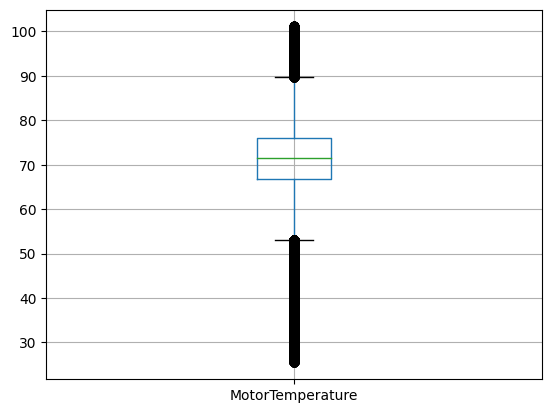

In [ ]:
data.boxplot(column=['MotorTemperature'])

For each original graph, we have 3 rows: acceleration, top an decceleration. We **select** only the temperature of one of the three parts, since it's the same temperature for the three.

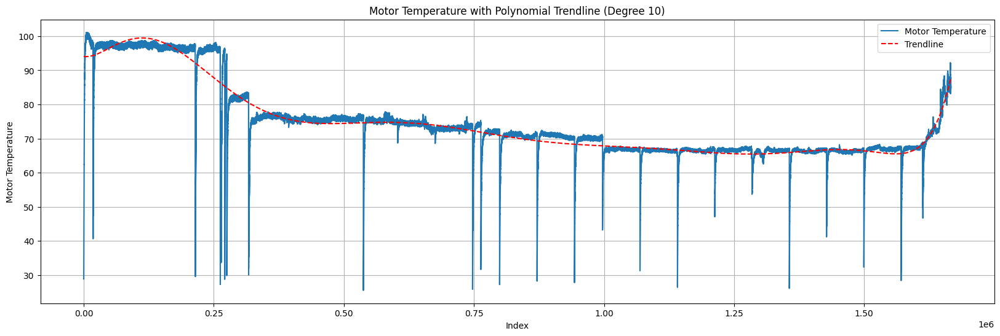

In [ ]:
filtered_data = data[data['CurveProcess'] == 'top']

# Extract the 'MotorTemperature' column
motor_temp = filtered_data['MotorTemperature']

# Create an array of x values (indices)
x = np.arange(len(motor_temp))

# Fit a polynomial regression model of degree 10 to the data
coefficients = np.polyfit(x, motor_temp, 10)
p = np.poly1d(coefficients)

# Generate the trendline values
trendline = p(x)

# Plot the 'MotorTemperature' data and the trendline
plt.figure(figsize=(20, 6))
plt.plot(x, motor_temp, label='Motor Temperature')
plt.plot(x, trendline, label='Trendline', linestyle='--', color='red')
plt.title('Motor Temperature with Polynomial Trendline (Degree 10)')
plt.xlabel('Index')
plt.ylabel('Motor Temperature')
plt.legend()
plt.grid(True)
plt.show()


We zoom in the visualization

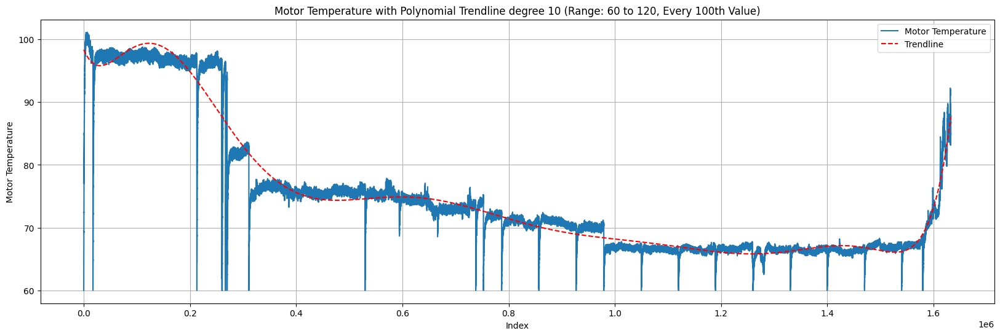

In [ ]:
# Filter temperature between 90 and 120
filtered_data_filtered = filtered_data[(filtered_data['MotorTemperature'] >= 60) & (filtered_data['MotorTemperature'] <= 120)]

# Extract the 'MotorTemperature' column
motor_temp = filtered_data_filtered['MotorTemperature']

# Create an array of x values (indices)
x = np.arange(len(motor_temp))

# Fit a polynomial regression model of degree 10 to the data
coefficients = np.polyfit(x, motor_temp, 10)
p = np.poly1d(coefficients)

# Generate the trendline values
trendline = p(x)

# Plot the 'MotorTemperature' data and the trendline
plt.figure(figsize=(20, 6))
plt.plot(x, motor_temp, label='Motor Temperature')
plt.plot(x, trendline, label='Trendline', linestyle='--', color='red')
plt.title('Motor Temperature with Polynomial Trendline degree 10 (Range: 60 to 120, Every 100th Value)')
plt.xlabel('Index')
plt.ylabel('Motor Temperature')
plt.legend()
plt.grid(True)
plt.show()

We can see a descendant trend in the temperature until the end of it's life where it increase its temperature dramatically.

In [ ]:
def fit_polynomial(columnData, polyDegree):
    """
    Fit a polynomial regression model to the data.

    Parameters:
        columnData (array-like): The input data for the regression.
        polyDegree (int): The degree of the polynomial to fit.

    Returns:
        indices
        trendline
    """
    # Create an array of x values (indices)
    x = np.arange(len(columnData))

    # Fit a polynomial regression model of degree 10 to the data
    coefficients = np.polyfit(x, columnData, polyDegree)
    p = np.poly1d(coefficients)

    # Generate the trendline values
    trendline = p(x)

    return x, trendline

## 4.2 Transformation

Instead of having a trend with values between 30 and 100, we transform the data in another unit, increment of temperature per 60 seconds.

In [ ]:
filtered_data['TimeDifference'] = filtered_data['Datetime'] - filtered_data['Datetime'].shift(10)

# Calculate temperature difference between each row and the 10th row before
filtered_data['TempDifference'] = filtered_data['MotorTemperature'] - filtered_data['MotorTemperature'].shift(10)

# Calculate temperature increase in 60 seconds
# Convert Timedelta to seconds and then calculate TempIncrease60s
filtered_data.loc[:,'TempIncrease60s'] = (filtered_data['TempDifference'] / filtered_data['TimeDifference'].dt.total_seconds()) * 60


## 4.3 Visualization & Interpratation

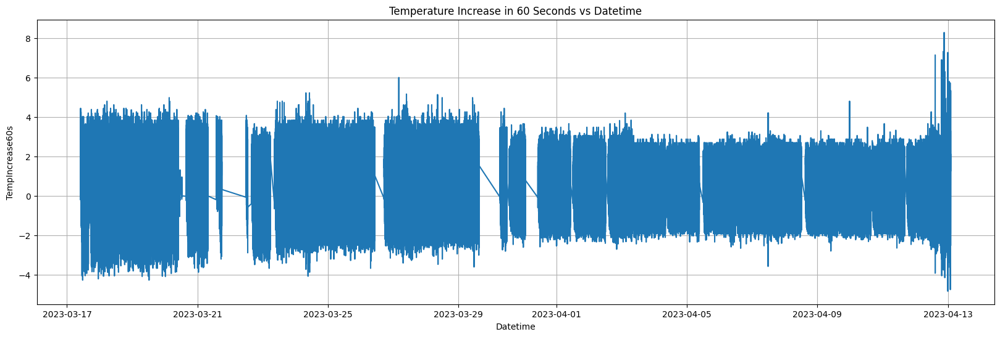

In [ ]:
plt.figure(figsize=(20, 6))
plt.plot(filtered_data['Datetime'], filtered_data['TempIncrease60s'], linestyle='-')
plt.title('Temperature Increase in 60 Seconds vs Datetime')
plt.xlabel('Datetime')
plt.ylabel('TempIncrease60s')
plt.grid(True)
plt.show()

**Finding**
*   We clearly got a **knowledge** and a range of values to limit a valid threshold to **deploy in the system in the future**.



We do further analysis with the new transfore temperature data:

<Axes: >

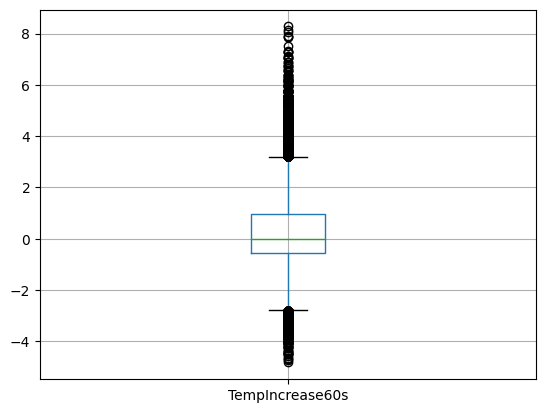

In [ ]:
filtered_data.boxplot(column=['TempIncrease60s'])

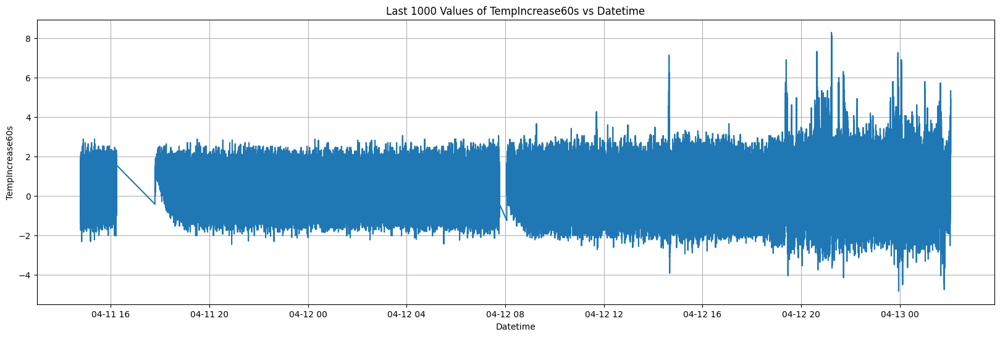

In [ ]:
# Select the last 1000 rows
last_1000_data = filtered_data.iloc[-100000:]

# Plot the 'Datetime' against 'TempIncrease60s' for the last 1000 rows
plt.figure(figsize=(20, 6))
plt.plot(last_1000_data['Datetime'], last_1000_data['TempIncrease60s'], linestyle='-')
plt.title('Last 1000 Values of TempIncrease60s vs Datetime')
plt.xlabel('Datetime')
plt.ylabel('TempIncrease60s')
plt.grid(True)
plt.show()

**Finding**

*   Clear increase in the temperature/minute at the end of the motor life. Easy to interpret and to deploy.


In [ ]:
filtered_data.columns

Index(['ID', 'MotorTemperature', 'Process', 'CurveProcess', 'TimeLength',
       'PositionInit', 'PositionLength', 'Speed1Mean', 'Speed1Std',
       'Speed1Min', 'Speed1Q1', 'Speed1Q2', 'Speed1Q3', 'Speed1Max',
       'Torque1Mean', 'Torque1Std', 'Torque1Min', 'Torque1Q1', 'Torque1Q2',
       'Torque1Q3', 'Torque1Max', 'Datetime', 'TimeDifference',
       'TempDifference', 'TempIncrease60s'],
      dtype='object')

Box Plot per Process

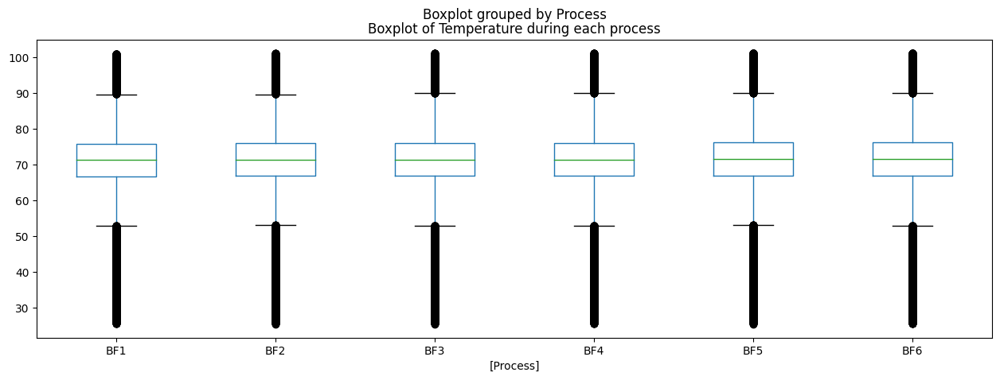

In [ ]:
filtered_data.boxplot(by =['Process'], column='MotorTemperature', grid = False, figsize=(15,5))
plt.title('Boxplot of Temperature during each process')
plt.show()

It means there's no influence in the temperature regarding the Process that is executed.

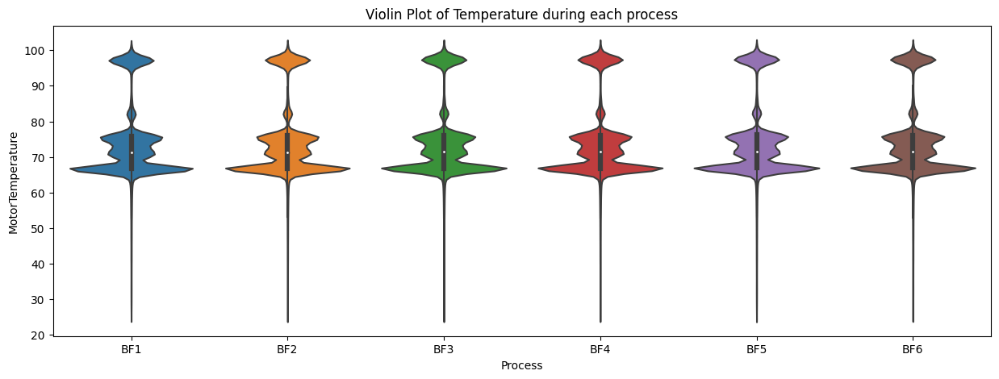

In [ ]:
# Create a violin plot
plt.figure(figsize=(15, 5))
sns.violinplot(x='Process', y='MotorTemperature', data=filtered_data)
plt.title('Violin Plot of Temperature during each process')
plt.show()


**Coling down time**<br>
Analysis of the temperature change when the motor is not moving.<br>
How many **degrees per minute** is the temperature reduced, when the motor does not move?

In [ ]:
filtered_data = data[data['CurveProcess'] == 'top']
filtered_data.loc[:,'Datetime'] = pd.to_datetime(filtered_data['Datetime'])

# Calculate the time difference in minutes
filtered_data.loc[:,'TimeDifference'] = filtered_data['Datetime'].diff().dt.total_seconds() / 60
filtered_data.loc[:,'TempDifference'] = filtered_data['MotorTemperature'] - filtered_data['MotorTemperature'].shift(1)
filtered_data.loc[:,'TempChangePerMinute'] = filtered_data.loc[:,'TempDifference'] / filtered_data.loc[:,'TimeDifference']


In [ ]:
# Find rows where the time difference is greater than 10 minutes
consecutive_rows = filtered_data[(filtered_data['TimeDifference'] > 10) & (filtered_data['TimeDifference'] < 30)]

# Print the result
print(consecutive_rows[['Datetime', 'TimeDifference', 'TempDifference', 'TempChangePerMinute']])

                   Datetime  TimeDifference  TempDifference  \
789525  2023-03-21 14:26:38       27.716667          -19.10   
952285  2023-03-23 09:02:44       24.066667          -10.98   
2991445 2023-04-03 08:16:41       21.800000          -27.20   
3638295 2023-04-06 12:09:39       17.250000          -19.84   
4283234 2023-04-09 15:27:27       25.350000          -26.01   
4838575 2023-04-12 08:03:31       17.650000          -21.98   

         TempChangePerMinute  
789525             -0.689116  
952285             -0.456233  
2991445            -1.247706  
3638295            -1.150145  
4283234            -1.026036  
4838575            -1.245326  


# 3 Transformation

## 3.1 Missing Value

Verify that there's no missing values.

In [ ]:
if (0 == sum(data.isnull().sum())):
    print ("No missing values found")
else:
    print ("Missing values found")
    print ("Graph: ", data.isnull().sum())

No missing values found


## 3.2 Outliers

Exploration of the Processes

<Axes: >

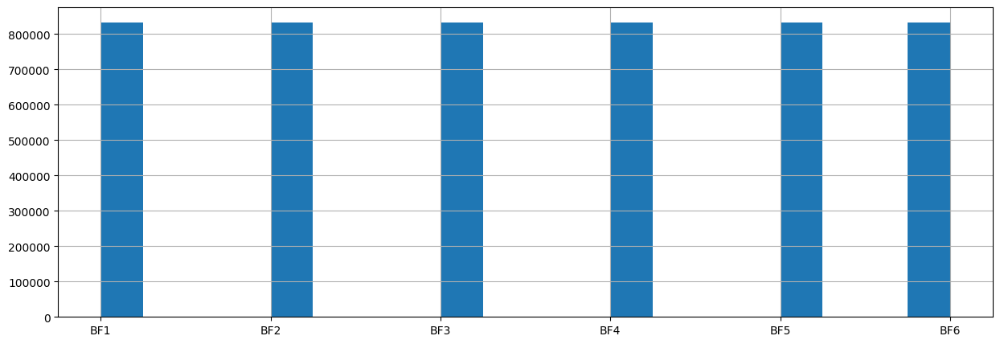

In [ ]:
data['Process'].hist(bins=20, figsize=(15,5))

We can see the data is balanced because we have mostly the same number of data for each movement.

### 3.2.1 Position

We know each of the movements, BF1 to BF6, shall be always the same in distance/position, therefore we can delete the outliers based on *PositionInit, PositionLength*

First, we visualize the boxplot for each process. We also differentiate between acceleration, top and decceleration

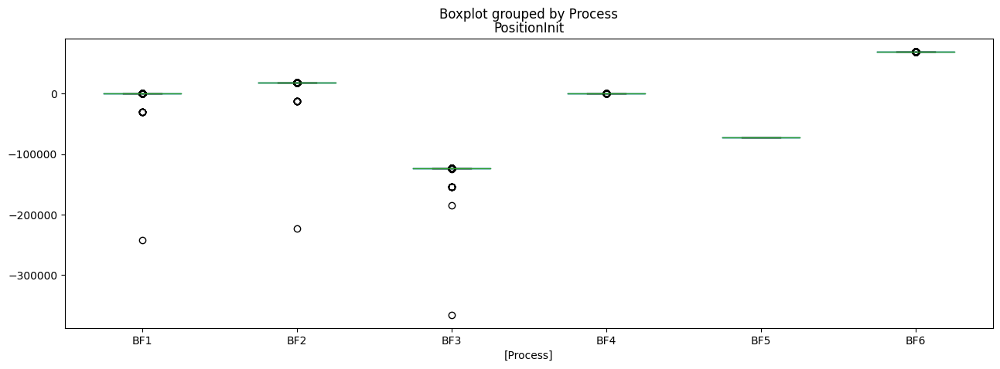

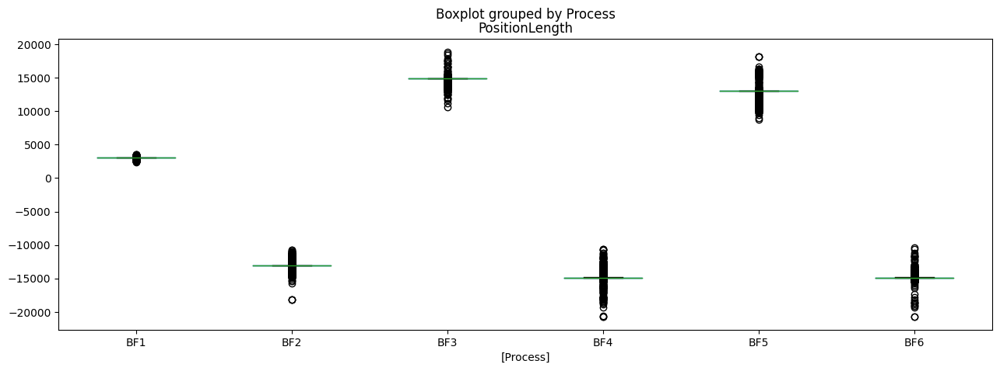

In [ ]:
positionData = ['PositionInit', 'PositionLength']
filtered_data = data[data['CurveProcess'] == 'acceleration']
for var in positionData:
  filtered_data.boxplot(by =['Process'], column=var, grid = False, figsize=(15,5))

We remove the outliers base on position, we consider just 1% for the outliers i.e. above 99th or below 1%

In [ ]:
processes = ['BF1', 'BF2', 'BF3', 'BF4', 'BF5', 'BF6' ]
columns = ['PositionInit','PositionLength']
for column in columns:
  print("\n\033[1mRemoving Outliers based on outliers at", column, "\033[0m")
  for process in processes:
    # Filter data by CurveProcess = 'acceleration' and Process = 'BF1'
    filtered_data = data[(data['CurveProcess'] == 'acceleration') & (data['Process'] == process)]

    # Calculate the 1st and 4th quarter values for column
    o1 = filtered_data[column].quantile(0.01)
    o4 = filtered_data[column].quantile(0.99)

    # Filter data to include only rows in the 1st or 4th quarter
    outliers = filtered_data[(filtered_data[column] <= o1) | (filtered_data[column] >= o4)]

    # Create a list of 'ID' values for the outliers
    outlier_ids = outliers['ID'].tolist()

    # Drop rows from the original 'data' DataFrame where 'ID' matches the outliers
    print("\n\033[1mRemoving Outliers from process:", process, "\033[0m")
    print ("IDs found as outliers based on the init length: ", len(outlier_ids) )
    print("Data shape before removing: ", data.shape)
    data = data[~data['ID'].isin(outlier_ids)]
    print("Data shape after removing: ", data.shape)


Removing Outliers based on outliers at PositionInit 

Removing Outliers from process: BF1 
IDs found as outliers based on the init length:  5811
Data shape before removing:  (4999986, 22)
Data shape after removing:  (4971384, 22)

Removing Outliers from process: BF2 
IDs found as outliers based on the init length:  5742
Data shape before removing:  (4971384, 22)
Data shape after removing:  (4942305, 22)

Removing Outliers from process: BF3 
IDs found as outliers based on the init length:  5613
Data shape before removing:  (4942305, 22)
Data shape after removing:  (4914183, 22)

Removing Outliers from process: BF4 
IDs found as outliers based on the init length:  6652
Data shape before removing:  (4914183, 22)
Data shape after removing:  (4883073, 22)

Removing Outliers from process: BF5 
IDs found as outliers based on the init length:  6029
Data shape before removing:  (4883073, 22)
Data shape after removing:  (4855362, 22)

Removing Outliers from process: BF6 
IDs found as outliers b

 acceleration 


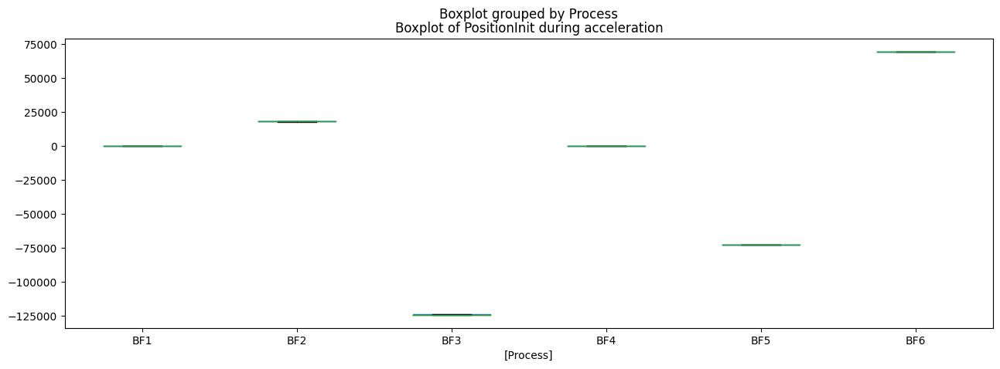

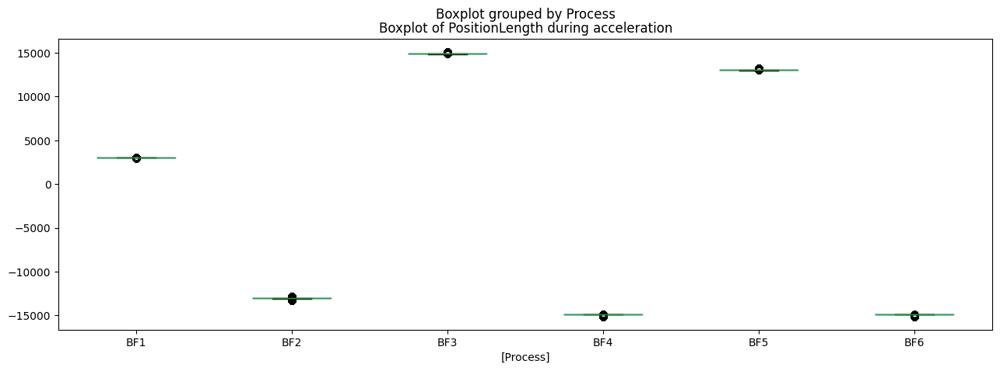

 top 


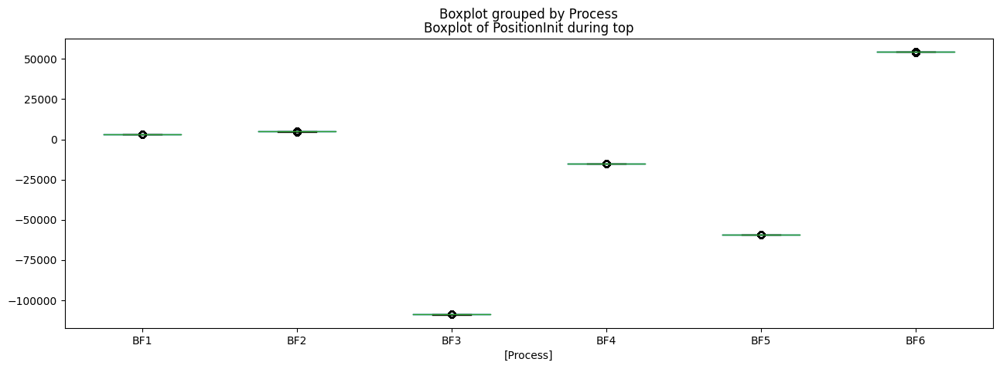

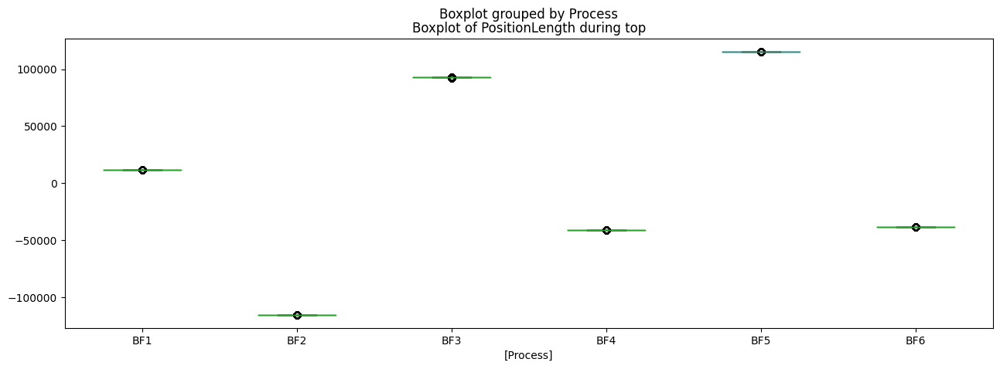

 decceleration 


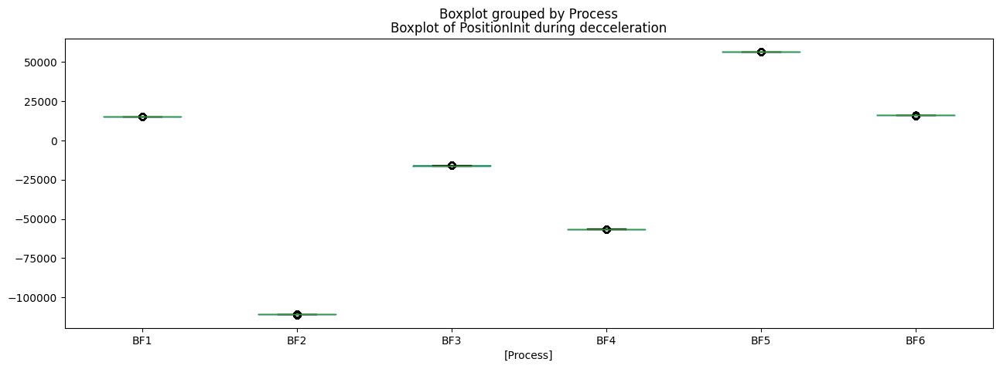

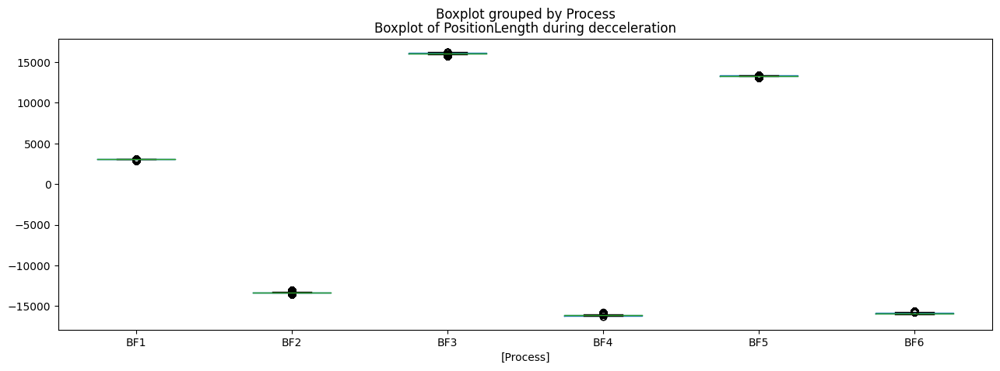

In [ ]:
curveProcesses = ['acceleration', 'top', 'decceleration']
positionData = ['PositionInit', 'PositionLength']
for curveProcess in curveProcesses:
  filtered_data = data[data['CurveProcess'] == curveProcess]
  print ("\033[1m", curveProcess, "\033[0m" )
  for var in positionData:
    filtered_data.boxplot(by =['Process'], column=var, grid = False, figsize=(15,5))
    plt.title('Boxplot of ' + var + ' during '+ curveProcess)

  plt.show()

In [ ]:
data.reset_index(drop=True, inplace=True)

## 3.3 Analisis variables

### 3.3.1 Speed

For Speed we shouldn't delete statistical outlier becasue there represent the pattern and anomalies to learn in our models.
On the other hand we'll visualize the data to understand it.

<Axes: >

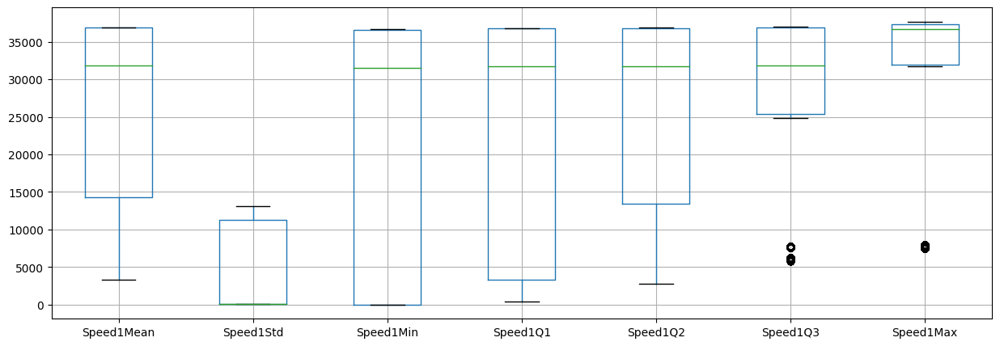

In [ ]:
data.boxplot(column=['Speed1Mean', 'Speed1Std', 'Speed1Min', 'Speed1Q1', 'Speed1Q2', 'Speed1Q3', 'Speed1Max'], figsize=(15,5))

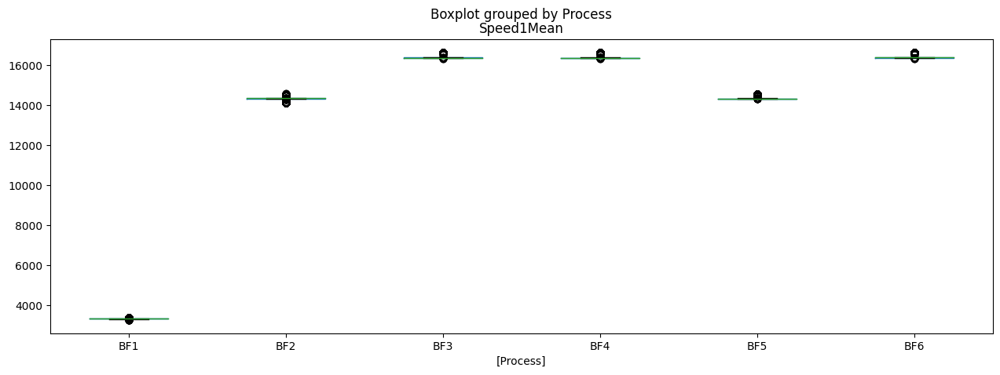

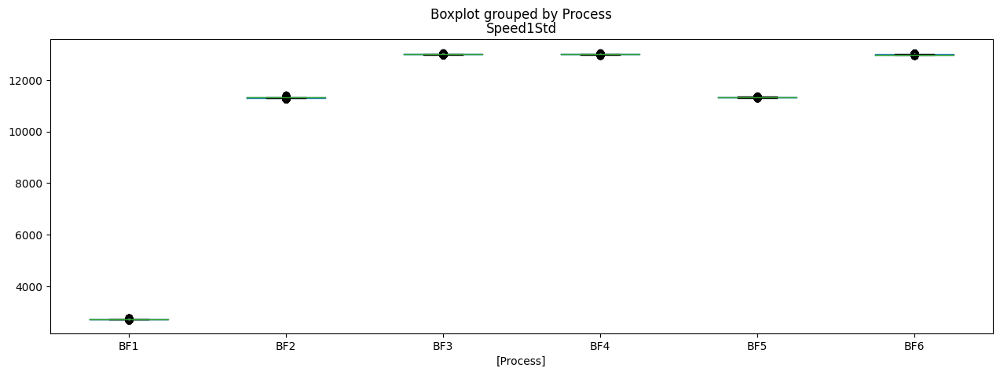

In [ ]:
speedData = ['Speed1Mean', 'Speed1Std']#, 'Speed1Min', 'Speed1Q1', 'Speed1Q2', 'Speed1Q3', 'Speed1Max']
filtered_data = data[data['CurveProcess'] == 'acceleration']
for var in speedData:
  filtered_data.boxplot(by =['Process'], column =var, grid = False, figsize=(15,5))

Checking the Speed data at the top of the curve, where the speed should be more stable

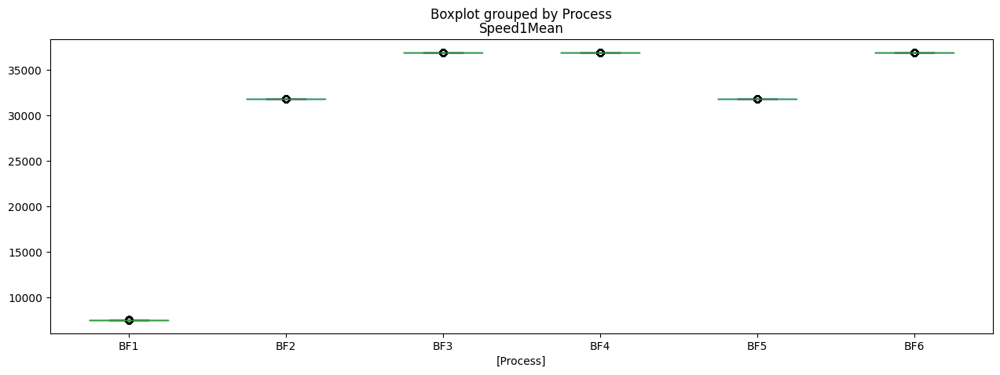

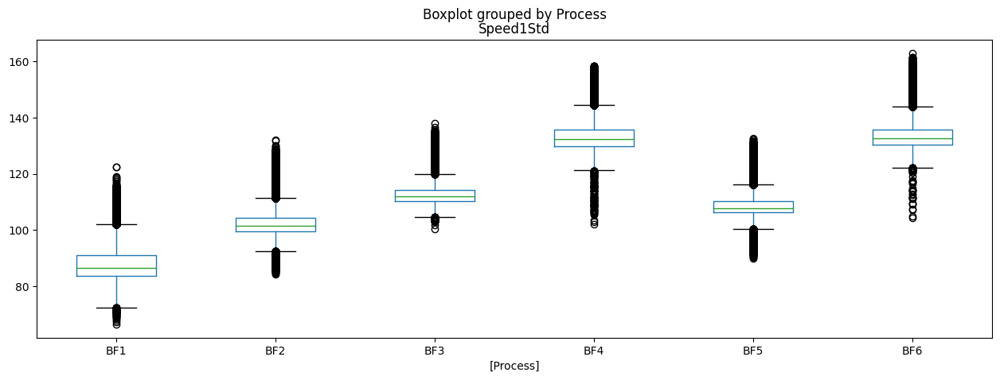

In [ ]:
speedData = ['Speed1Mean', 'Speed1Std']#, 'Speed1Min', 'Speed1Q1', 'Speed1Q2', 'Speed1Q3', 'Speed1Max']
filtered_data = data[data['CurveProcess'] == 'top']
for var in speedData:
  filtered_data.boxplot(by =['Process'], column =var, grid = False, figsize=(15,5))

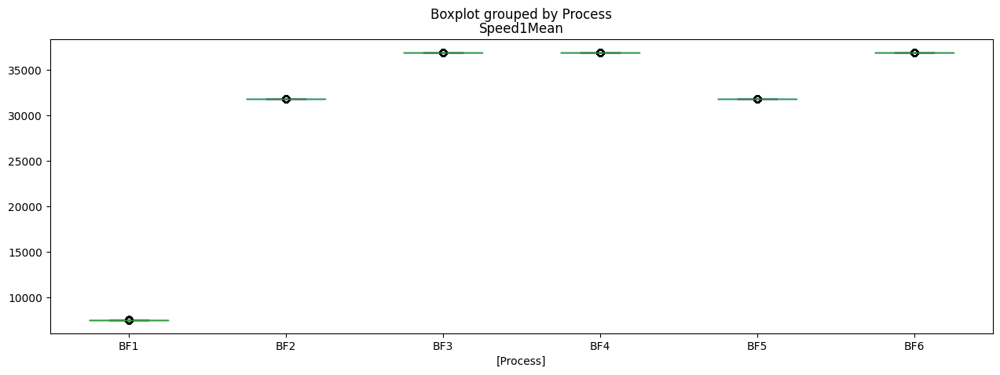

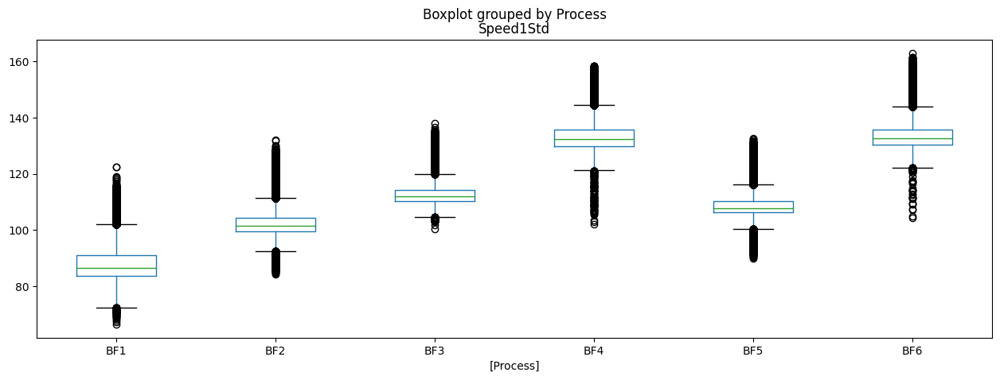

In [ ]:
speedData = ['Speed1Mean', 'Speed1Std']#, 'Speed1Min', 'Speed1Q1', 'Speed1Q2', 'Speed1Q3', 'Speed1Max']
filtered_data = data[data['CurveProcess'] == 'decceleration']
for var in speedData:
  filtered_data.boxplot(by =['Process'], column =var, grid = False, figsize=(15,5))

**Trend analysis during acceleration**

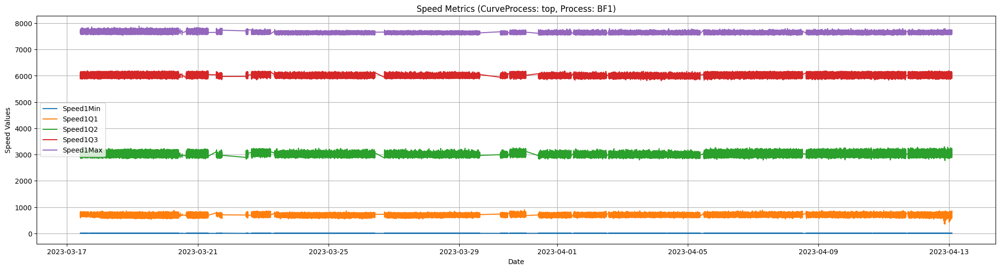

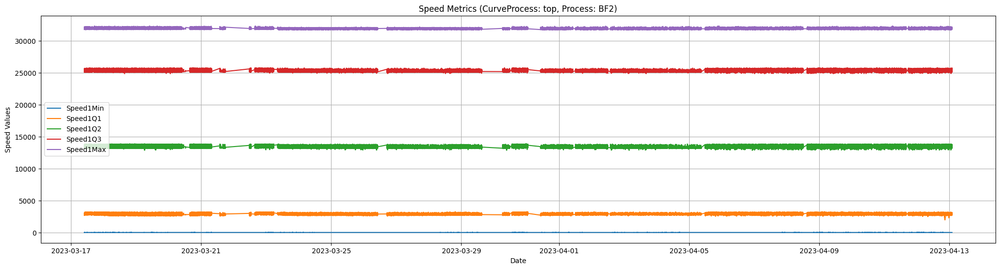

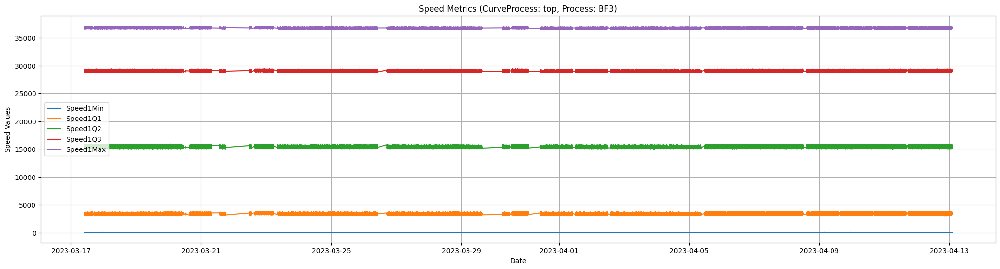

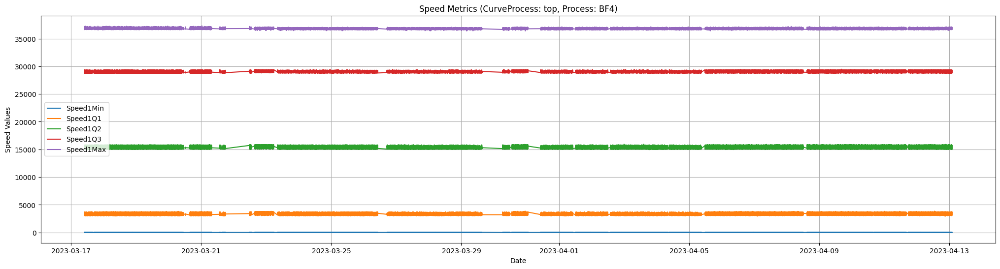

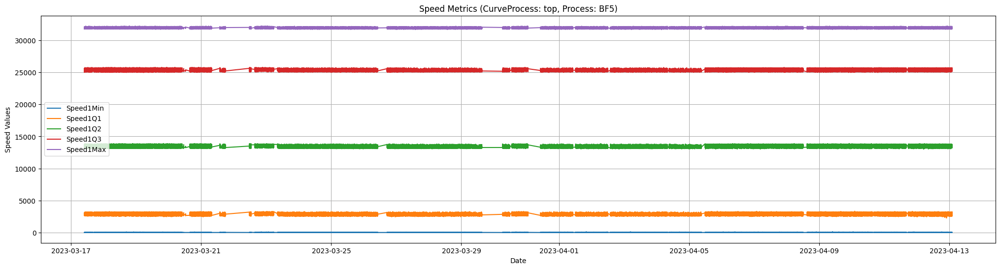

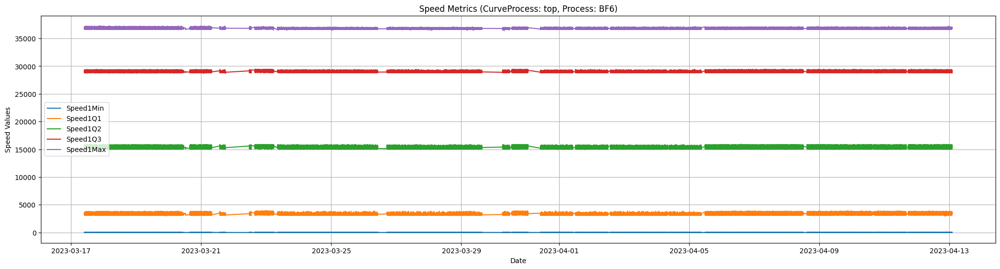

In [ ]:
processes = ['BF1', 'BF2', 'BF3', 'BF4', 'BF5', 'BF6']

for process in processes:
  # Filter data by 'CurveProcess' and 'Process' conditions
  filtered_data = data[(data['CurveProcess'] == 'acceleration') & (data['Process'] == process)]
  filtered_data.reset_index(drop=True, inplace=True)
  # Select the columns to plot
  columns_to_plot = ['Speed1Min', 'Speed1Q1', 'Speed1Q2', 'Speed1Q3', 'Speed1Max']

  # Plot the selected columns
  plt.figure(figsize=(25, 6))

  # Loop through the columns and plot them
  for column in columns_to_plot:
      plt.plot(filtered_data.Datetime, filtered_data[column], label=column)

  #plt.plot(filtered_data.index, filtered_data['Speed1Q2'], label=column)
  plt.title('Speed Metrics (CurveProcess: top, Process: '+ process + ')')
  plt.xlabel('Date')
  plt.ylabel('Speed Values')
  plt.legend()
  plt.grid(True)
  plt.show()


The speed data does not suffer mayor alteration and stay in the same range of values during acceleration.

**Trend analysis during top speed**

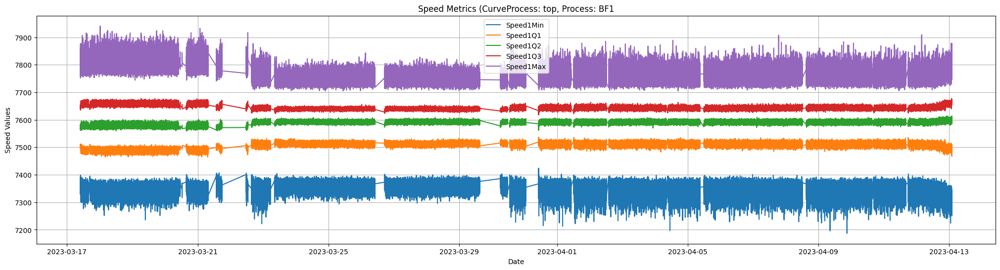

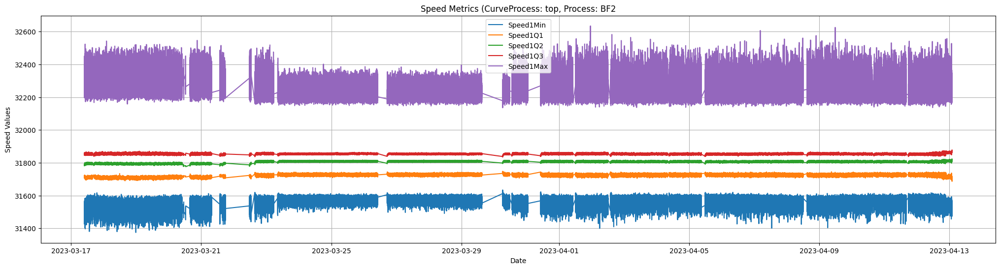

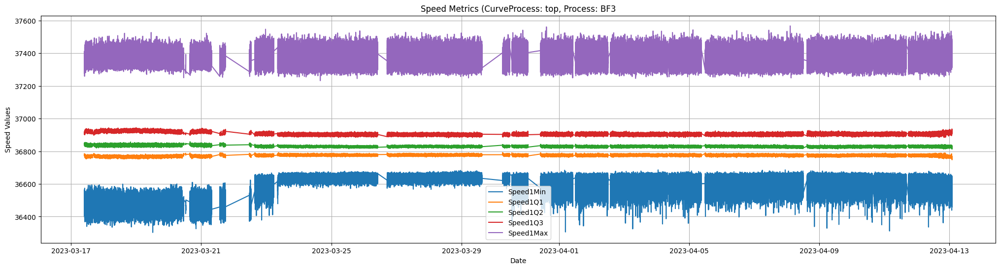

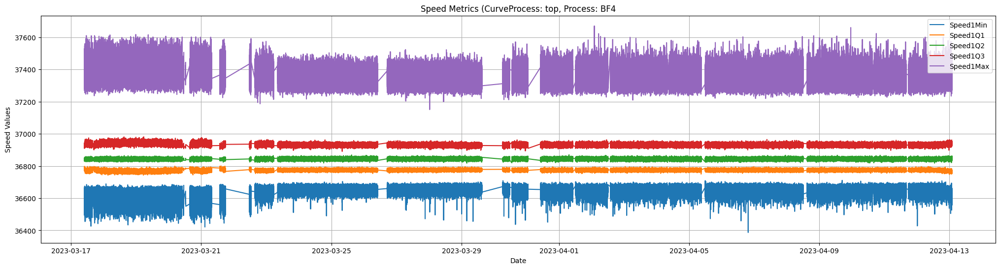

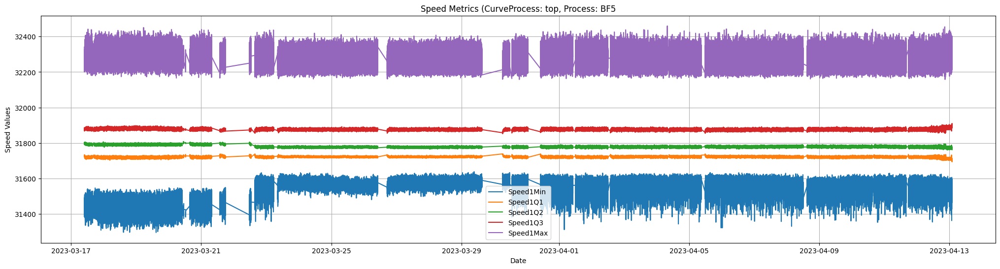

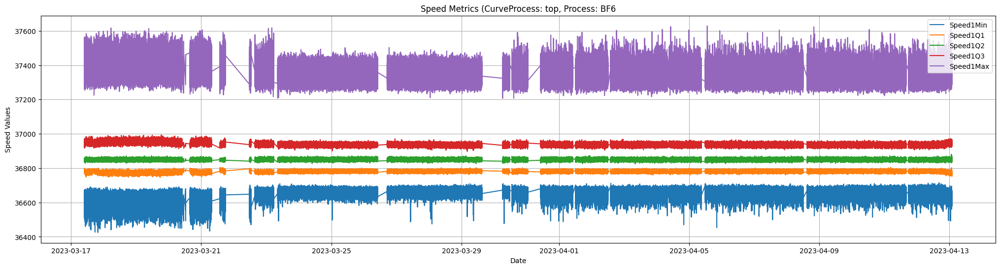

In [ ]:
processes = ['BF1', 'BF2', 'BF3', 'BF4', 'BF5', 'BF6']

for process in processes:
  # Filter data by 'CurveProcess' and 'Process' conditions
  filtered_data = data[(data['CurveProcess'] == 'top') & (data['Process'] == process)]
  filtered_data.reset_index(drop=True, inplace=True)
  # Select the columns to plot
  columns_to_plot = ['Speed1Min', 'Speed1Q1', 'Speed1Q2', 'Speed1Q3', 'Speed1Max']

  # Plot the selected columns
  plt.figure(figsize=(25, 6))

  # Loop through the columns and plot them
  for column in columns_to_plot:
      plt.plot(filtered_data.Datetime, filtered_data[column], label=column)

  plt.title('Speed Metrics (CurveProcess: top, Process: '+ process)
  plt.xlabel('Date')
  plt.ylabel('Speed Values')
  plt.legend()
  plt.grid(True)
  plt.show()


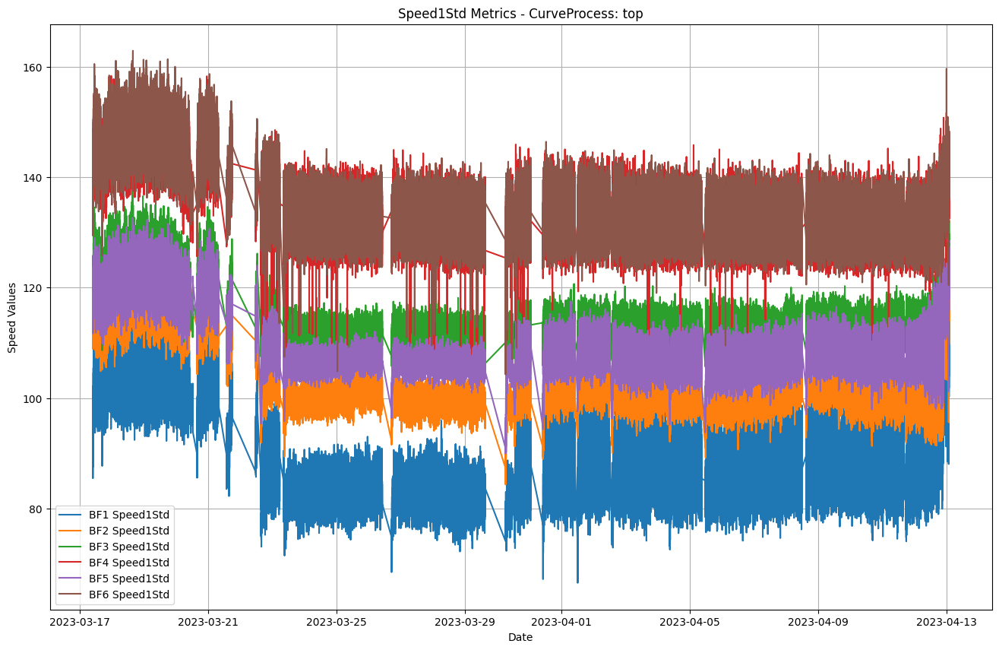

In [ ]:
processes = ['BF1', 'BF2', 'BF3', 'BF4', 'BF5', 'BF6']

# Plot the selected columns
plt.figure(figsize=(16, 10))

for process in processes:
# Filter data by 'CurveProcess' and 'Process' conditions
  filtered_data = data[(data['CurveProcess'] == 'top') & (data['Process'] == process)]
  filtered_data.reset_index(drop=True, inplace=True)
  # Select the columns to plot
  columns_to_plot = ['Speed1Std']

  plt.plot(filtered_data.Datetime, filtered_data.Speed1Std, label='Speed1Std')


#plt.plot(filtered_data.index, filtered_data['Speed1Q2'], label=column)
plt.title('Speed1Std Metrics - CurveProcess: top')
plt.xlabel('Date')
plt.ylabel('Speed Values')
plt.legend(['BF1 Speed1Std', 'BF2 Speed1Std','BF3 Speed1Std', 'BF4 Speed1Std', 'BF5 Speed1Std', 'BF6 Speed1Std'])
plt.grid(True)
plt.show()


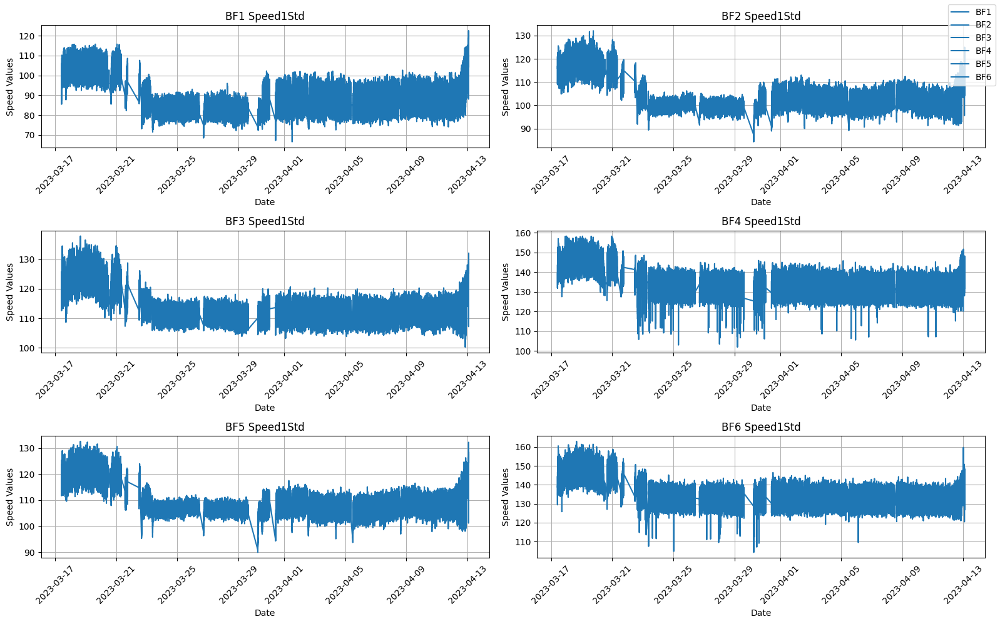

In [ ]:
processes = ['BF1', 'BF2', 'BF3', 'BF4', 'BF5', 'BF6']

# Create a 3x2 subplot grid
fig, axes = plt.subplots(3, 2, figsize=(16, 10))

# Plot the selected columns for each process
for i, process in enumerate(processes):
    # Filter data by 'CurveProcess' and 'Process' conditions
    filtered_data = data[(data['CurveProcess'] == 'top') & (data['Process'] == process)]
    filtered_data.reset_index(drop=True, inplace=True)
    # Select the columns to plot
    columns_to_plot = ['Speed1Std']

    # Plot on the respective subplot
    row, col = divmod(i, 2)
    ax = axes[row, col]
    ax.plot(filtered_data['Datetime'], filtered_data['Speed1Std'])
    ax.set_title(f'{process} Speed1Std')
    ax.set_xlabel('Date')
    ax.set_ylabel('Speed Values')
    ax.grid(True)

    # Rotate x-axis labels by 45 degrees
    plt.setp(ax.get_xticklabels(), rotation=45)


# Add a common legend
fig.legend(processes, loc='upper right')

# Adjust subplot layout
plt.tight_layout()

# Show the subplots
plt.show()


We look at the last values:

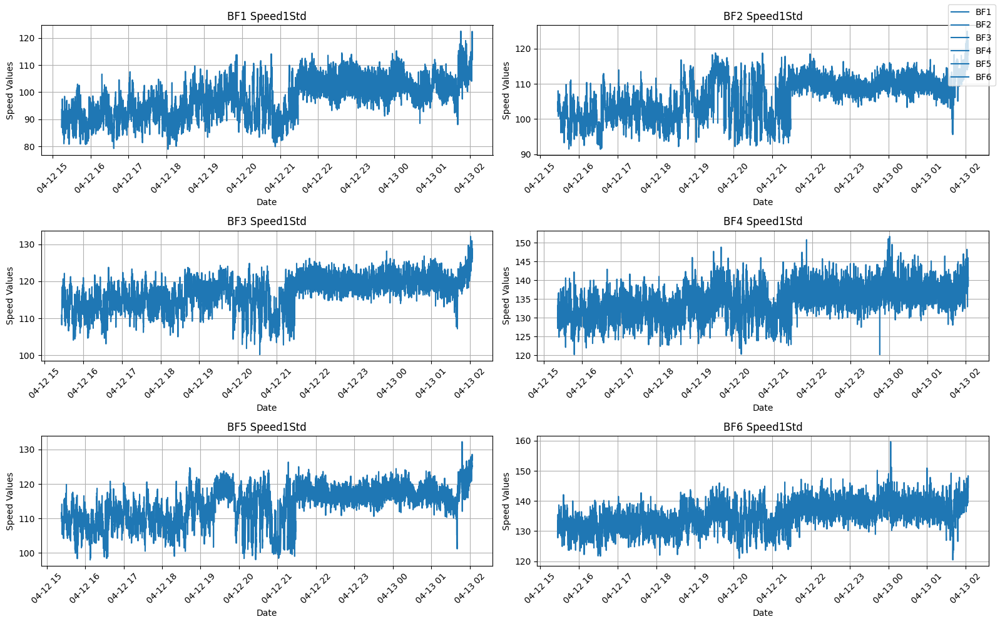

In [ ]:
processes = ['BF1', 'BF2', 'BF3', 'BF4', 'BF5', 'BF6']
num_samples_to_plot = 5000

# Create a 3x2 subplot grid
fig, axes = plt.subplots(3, 2, figsize=(16, 10))

# Plot the selected columns for each process
for i, process in enumerate(processes):
    # Filter data by 'CurveProcess' and 'Process' conditions and select the last 2000 samples
    filtered_data = data[(data['CurveProcess'] == 'top') & (data['Process'] == process)].tail(num_samples_to_plot)
    filtered_data.reset_index(drop=True, inplace=True)

    # Select the columns to plot
    columns_to_plot = ['Speed1Std']

    # Plot on the respective subplot
    row, col = divmod(i, 2)
    ax = axes[row, col]
    ax.plot(filtered_data['Datetime'], filtered_data['Speed1Std'])
    ax.set_title(f'{process} Speed1Std')
    ax.set_xlabel('Date')
    ax.set_ylabel('Speed Values')
    ax.grid(True)

    # Rotate x-axis labels by 45 degrees
    plt.setp(ax.get_xticklabels(), rotation=45)

# Add a common legend
fig.legend(processes, loc='upper right')

# Adjust subplot layout
plt.tight_layout()

# Show the subplots
plt.show()



In the last values of the motor's life, we can observe a small increase in the standard deviation for the speed. Considering this deviation is really small we will not considered this option to determine our target.

**Trend analysis during decceleration speed**

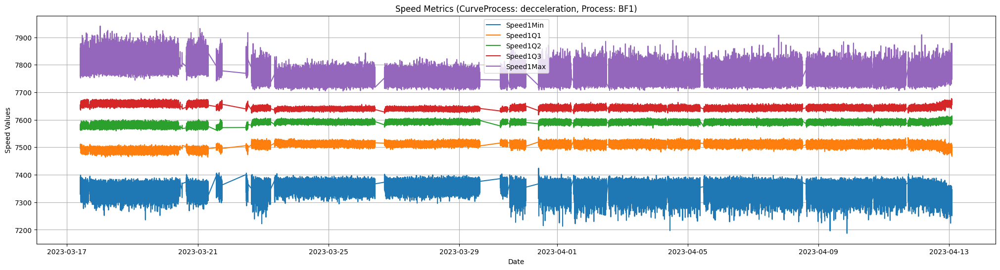

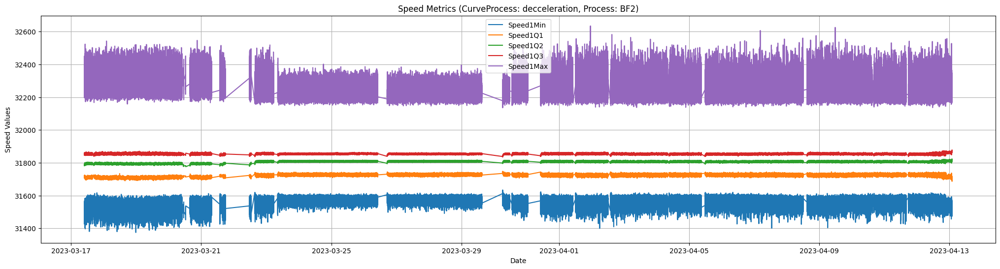

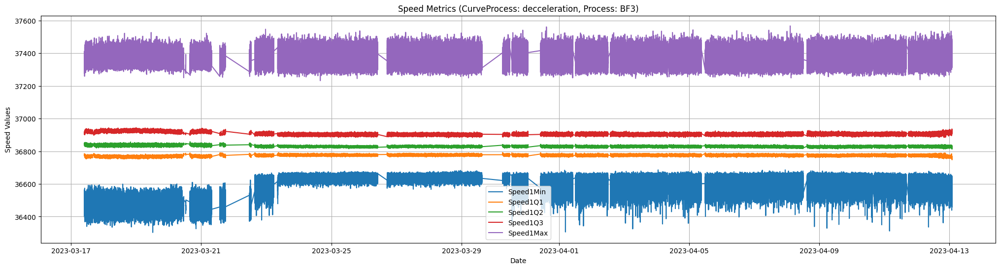

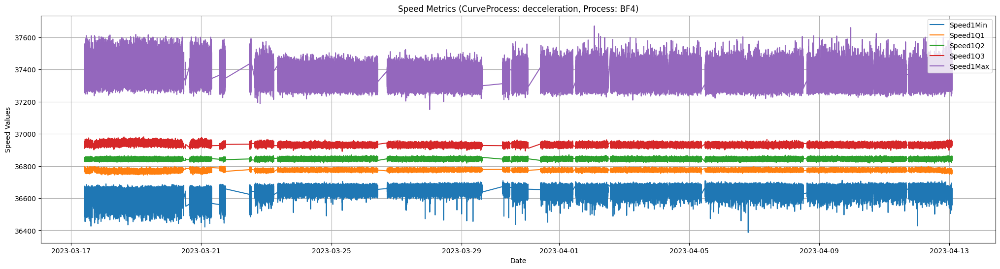

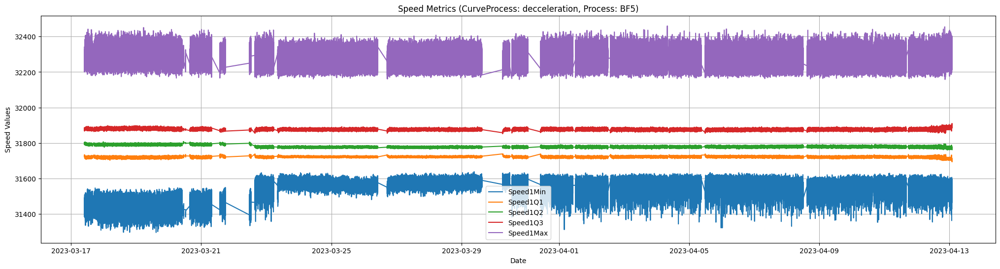

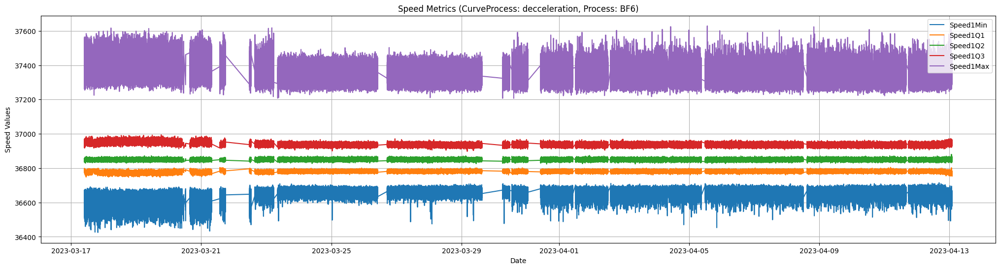

In [ ]:
processes = ['BF1', 'BF2', 'BF3', 'BF4', 'BF5', 'BF6']

for process in processes:
  # Filter data by 'CurveProcess' and 'Process' conditions
  filtered_data = data[(data['CurveProcess'] == 'decceleration') & (data['Process'] == process)]
  filtered_data.reset_index(drop=True, inplace=True)
  # Select the columns to plot
  columns_to_plot = ['Speed1Min', 'Speed1Q1', 'Speed1Q2', 'Speed1Q3', 'Speed1Max']

  # Plot the selected columns
  plt.figure(figsize=(25, 6))

  # Loop through the columns and plot them
  for column in columns_to_plot:
      plt.plot(filtered_data.Datetime, filtered_data[column], label=column)

  #plt.plot(filtered_data.index, filtered_data['Speed1Q2'], label=column)
  plt.title('Speed Metrics (CurveProcess: decceleration, Process: '+ process + ')')
  plt.xlabel('Date')
  plt.ylabel('Speed Values')
  plt.legend()
  plt.grid(True)
  plt.show()


**Overlapping Temperature and Speed**

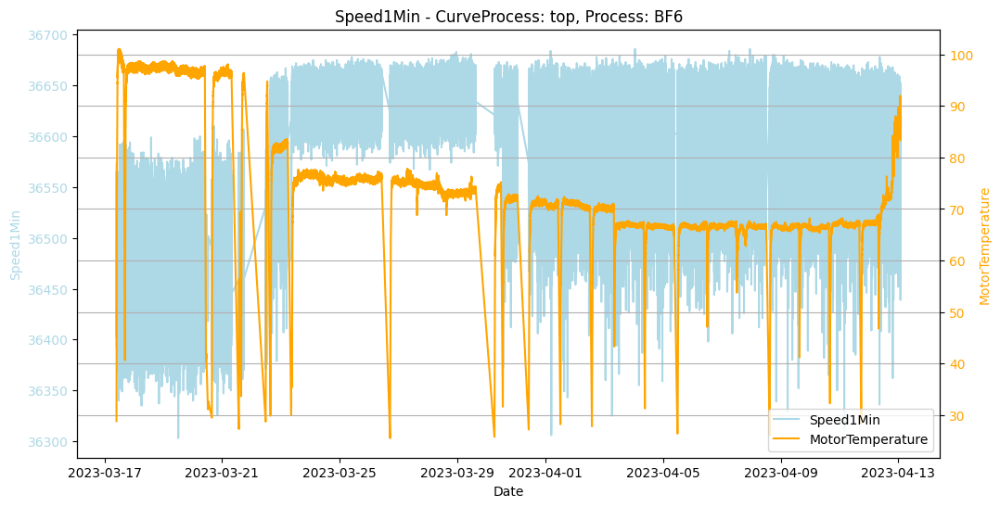

In [ ]:
# Filter data by 'CurveProcess' and 'Process' conditions
filtered_data = data[(data['CurveProcess'] == 'top') & (data['Process'] == 'BF3')]
filtered_data.reset_index(drop=True, inplace=True)

# Create the first axis and plot y1
fig, ax1 = plt.subplots(figsize=(12, 6))
ax1.plot(filtered_data.Datetime, filtered_data['Speed1Min'], color='lightblue', label='y1')
ax1.set_xlabel('Date')
ax1.set_ylabel('Speed1Min', color='lightblue')
ax1.tick_params(axis='y', labelcolor='lightblue')

# Create a second axis sharing the same x-axis
ax2 = ax1.twinx()
ax2.plot(filtered_data.Datetime, filtered_data['MotorTemperature'], color='orange', label='y2')
ax2.set_ylabel('MotorTemperature', color='orange')
ax2.tick_params(axis='y', labelcolor='orange')


plt.title('Speed1Min - CurveProcess: top, Process: '+ process)
# Combine the legends from both axes
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
lines = lines1 + lines2

plt.legend(lines, ['Speed1Min', 'MotorTemperature', ], loc='lower right')
plt.grid(True)
plt.show()

**Finding**:  

1.   The drop of the temperature coincide, based on the written report, when the system was moved to a cooler location.
2.   The more stable Speed coincide during an electrical change.
3.   The observed data can be use to validate motors and its electrical configuration in the future.

### 3.3.2 Torque

For Torque, like with Speed, we shouldn't delete statistical outlier becasue there represent the pattern and anomalies to learn in our models.
On the other hand we'll visualize the data to understand it.

<Axes: >

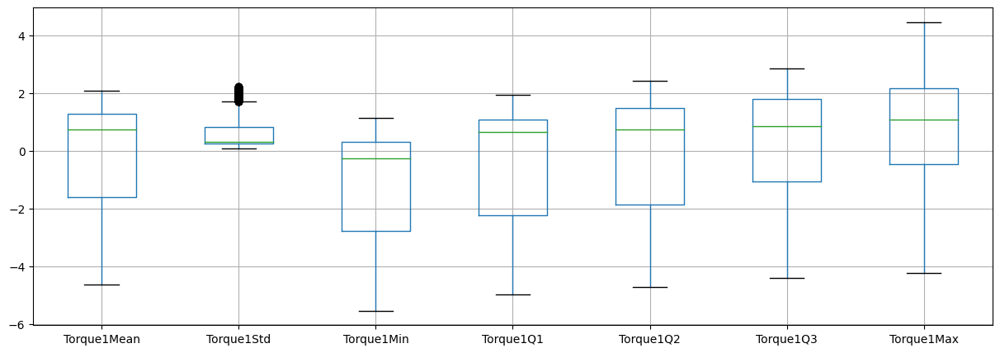

In [ ]:
data.boxplot(column=['Torque1Mean', 'Torque1Std', 'Torque1Min', 'Torque1Q1', 'Torque1Q2', 'Torque1Q3', 'Torque1Max'], figsize=(15,5))

 acceleration 


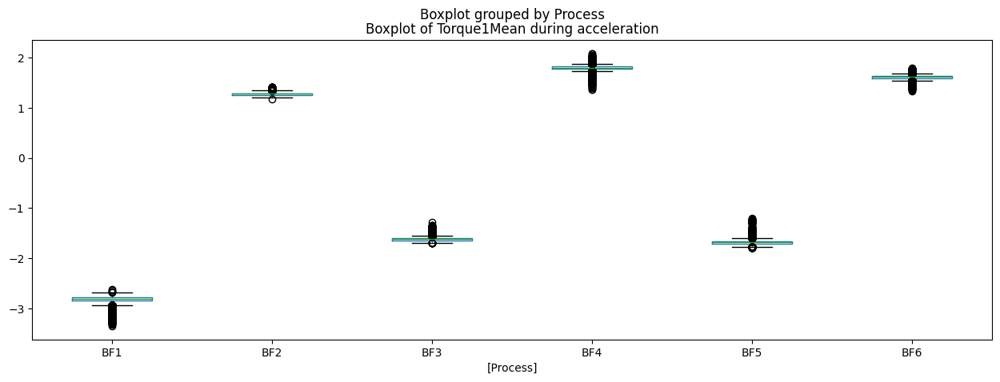

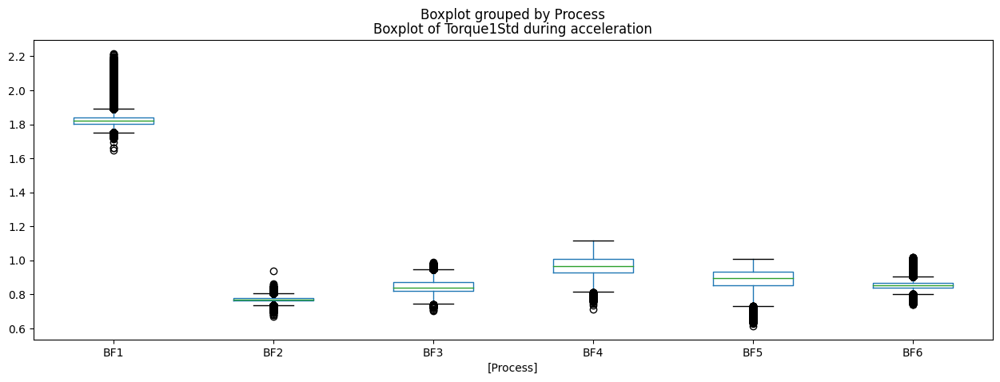

 top 


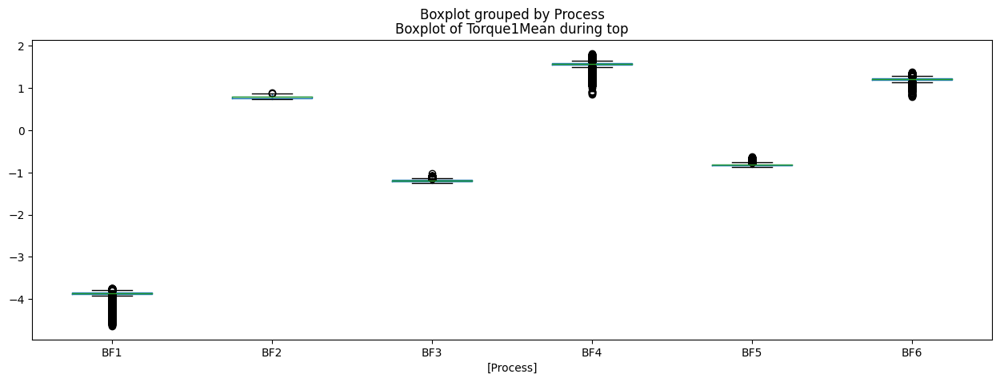

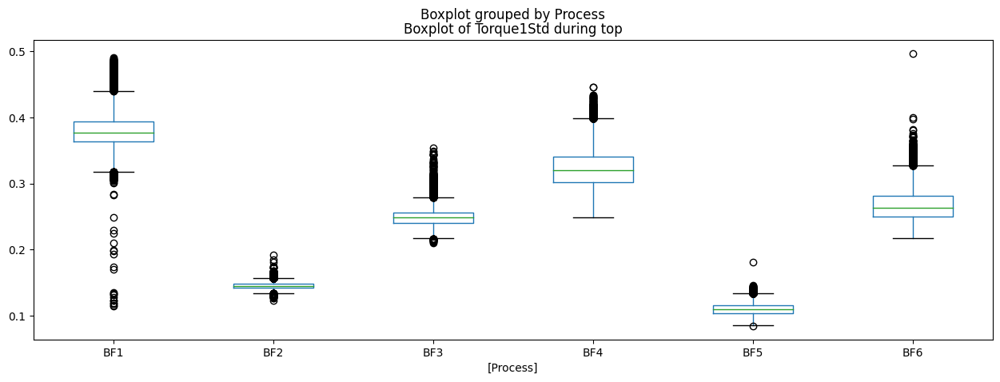

 decceleration 


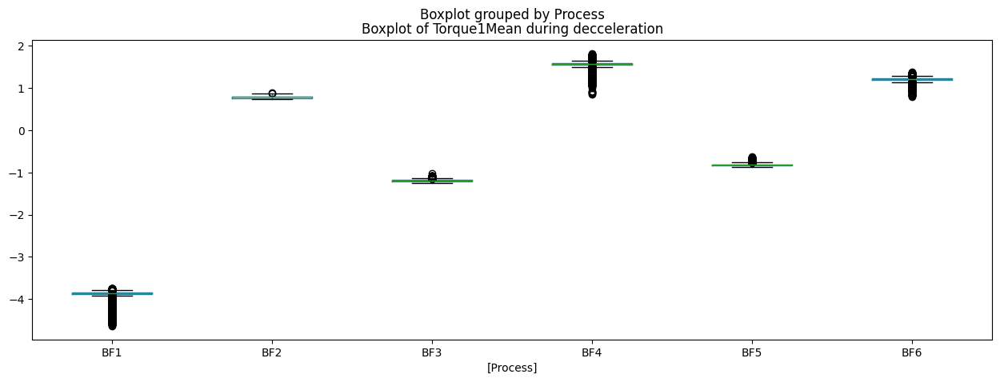

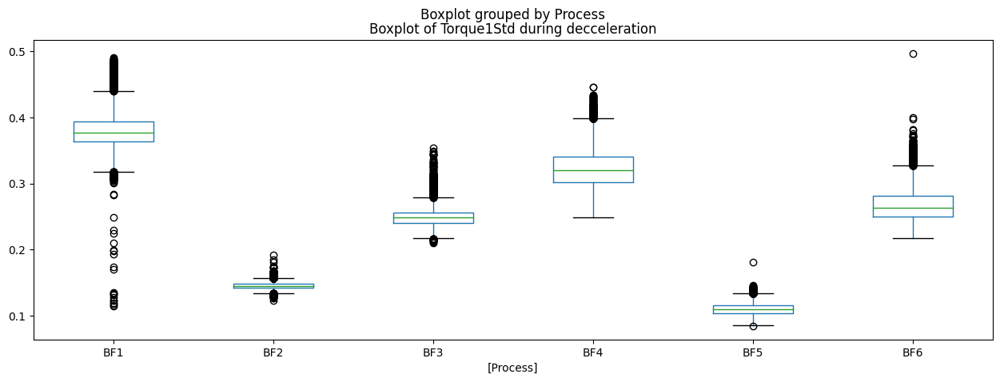

In [ ]:
curveProcesses = ['acceleration', 'top', 'decceleration']
torqueData = ['Torque1Mean', 'Torque1Std']
for curveProcess in curveProcesses:
  filtered_data = data[data['CurveProcess'] == curveProcess]
  print ("\033[1m", curveProcess, "\033[0m" )
  for var in torqueData:
    filtered_data.boxplot(by =['Process'], column=var, grid = False, figsize=(15,5))
    #plt.title('Boxplot of Motor Temperature by Process and for ' + ' during '+ curveProcess)
    plt.title('Boxplot of ' + var + ' during '+ curveProcess)

  plt.show()


Checking the Torque data at the top of the curve, where the Torque should be more stable.

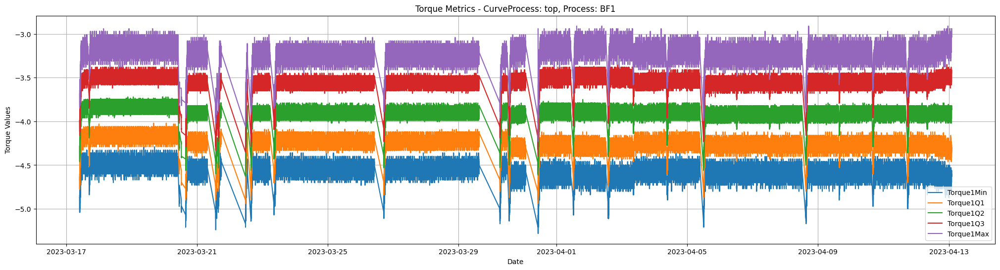

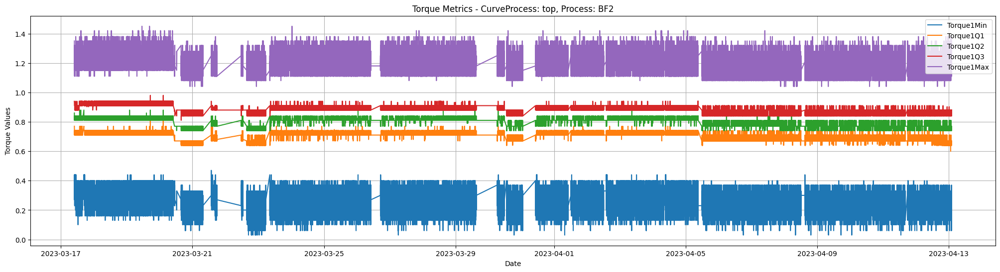

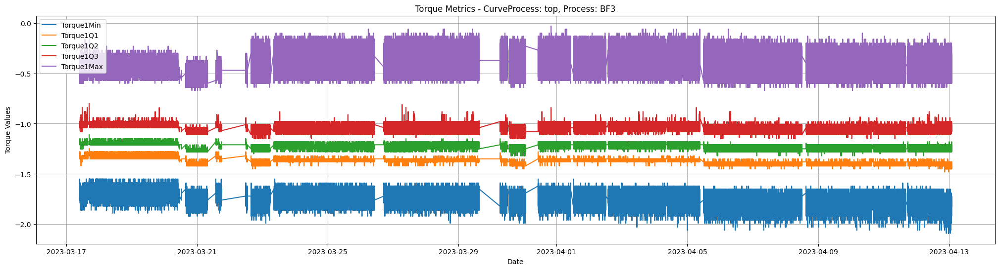

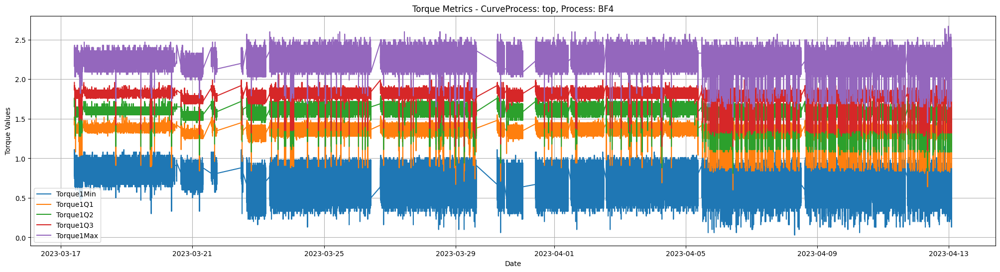

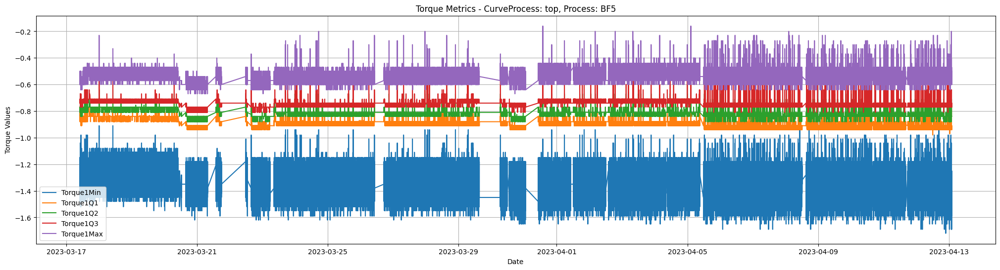

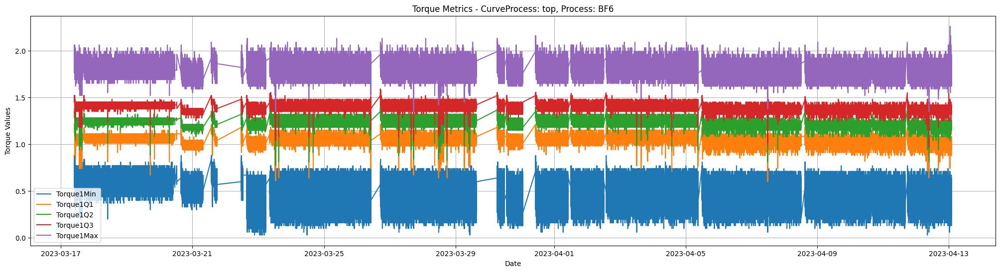

In [ ]:
processes = ['BF1', 'BF2', 'BF3', 'BF4', 'BF5', 'BF6']

for process in processes:
  # Filter data by 'CurveProcess' and 'Process' conditions
  filtered_data = data[(data['CurveProcess'] == 'top') & (data['Process'] == process)]
  filtered_data.reset_index(drop=True, inplace=True)
  # Select the columns to plot
  columns_to_plot = ['Torque1Min', 'Torque1Q1', 'Torque1Q2', 'Torque1Q3', 'Torque1Max']

  # Plot the selected columns
  plt.figure(figsize=(25, 6))

  # Loop through the columns and plot them
  for column in columns_to_plot:
      plt.plot(filtered_data.Datetime, filtered_data[column], label=column)

  #plt.plot(filtered_data.index, filtered_data['Speed1Q2'], label=column)
  plt.title('Torque Metrics - CurveProcess: top, Process: ' + process)
  plt.xlabel('Date')
  plt.ylabel('Torque Values')
  plt.legend()
  plt.grid(True)
  plt.show()


Let's look at the values that have larger variation, Torque1Max

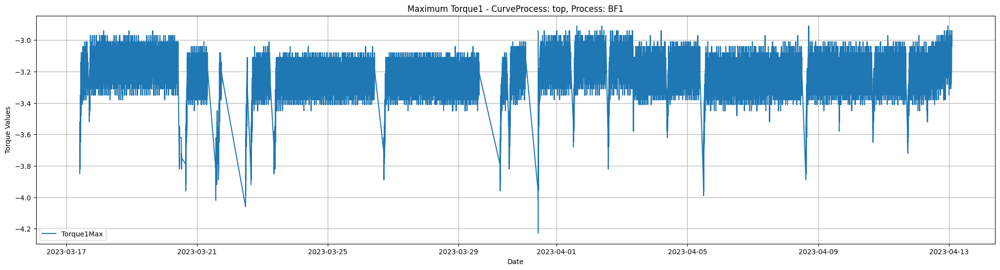

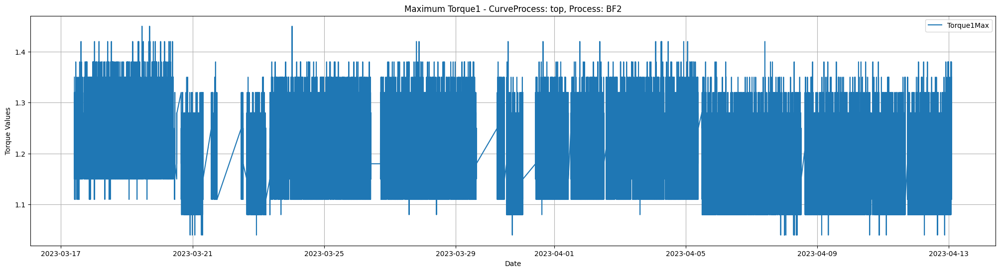

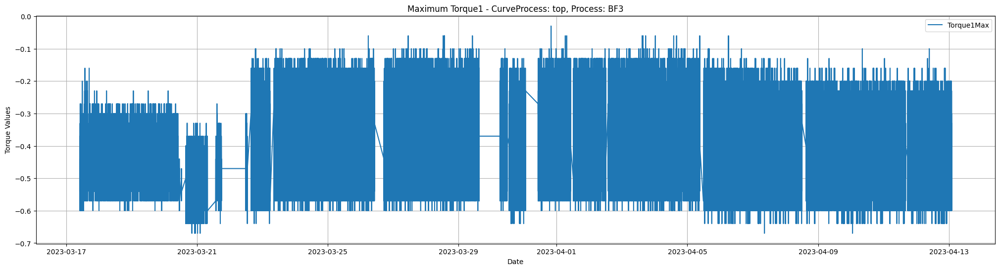

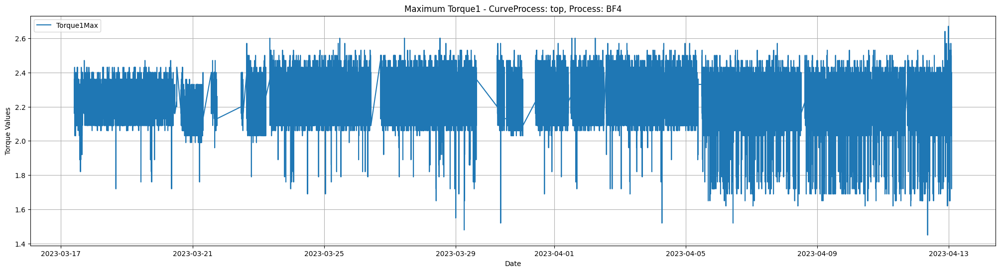

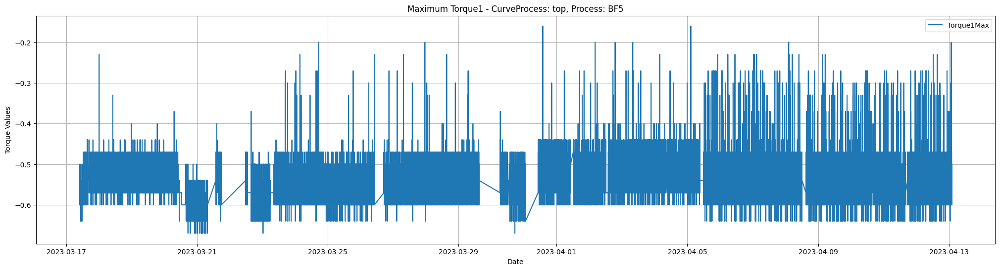

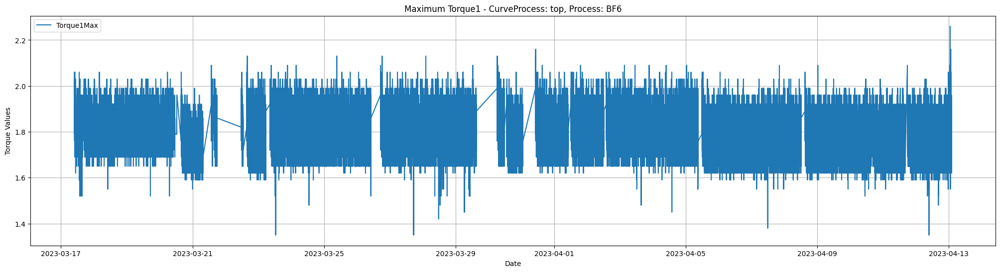

In [ ]:
processes = ['BF1', 'BF2', 'BF3', 'BF4', 'BF5', 'BF6']

for process in processes:
  # Filter data by 'CurveProcess' and 'Process' conditions
  filtered_data = data[(data['CurveProcess'] == 'top') & (data['Process'] == process)]
  filtered_data.reset_index(drop=True, inplace=True)
  # Select the columns to plot
  columns_to_plot = ['Torque1Max']

  # Plot the selected columns
  plt.figure(figsize=(25, 6))

  # Loop through the columns and plot them
  for column in columns_to_plot:
      plt.plot(filtered_data.Datetime, filtered_data[column], label=column)

  #plt.plot(filtered_data.index, filtered_data['Speed1Q2'], label=column)
  plt.title('Maximum Torque1 - CurveProcess: top, Process: ' + process)
  plt.xlabel('Date')
  plt.ylabel('Torque Values')
  plt.legend()
  plt.grid(True)
  plt.show()


**Finding:**
*   With a simple visualization we can observe and increase amount of outliers values, at the end of the motor's life, for the maximum torque, specialy for BF4 and BF5.


Let's look only at **BF4 and Torque1Max**

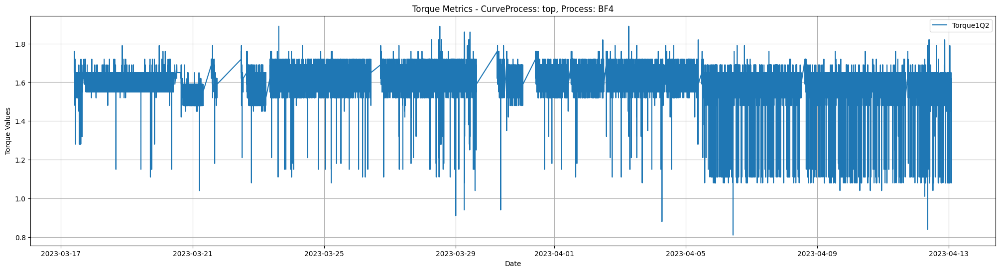

In [ ]:
# Filter data by 'CurveProcess' and 'Process' conditions
filtered_data = data[(data['CurveProcess'] == 'top') & (data['Process'] == 'BF4')]
filtered_data.reset_index(drop=True, inplace=True)
# Select the columns to plot
columns_to_plot = ['Torque1Q2']

# Plot the selected columns
plt.figure(figsize=(25, 6))

# Loop through the columns and plot them
for column in columns_to_plot:
    plt.plot(filtered_data.Datetime, filtered_data[column], label=column)

# Calculate and plot the trend line (you can change the degree of the polynomial as needed)
# trend_line = np.polyfit(filtered_data.index, filtered_data['Torque1Max'], 3)  # Linear trend line
# trend_values = np.polyval(trend_line, filtered_data.index)
# plt.plot(filtered_data.Datetime, trend_values, label='Trend Line', linestyle='--', color='red')

plt.title('Torque Metrics - CurveProcess: top, Process: BF4')
plt.xlabel('Date')
plt.ylabel('Torque Values')
plt.legend()
plt.grid(True)
plt.show()


We repeat the visualizations for **Torque1Q2** because it looks that it has an important variation as well.

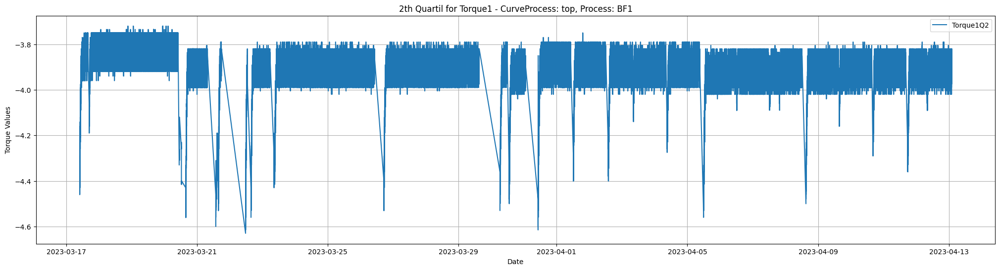

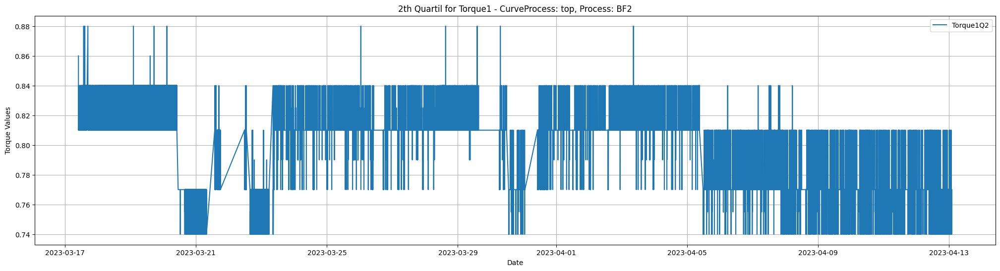

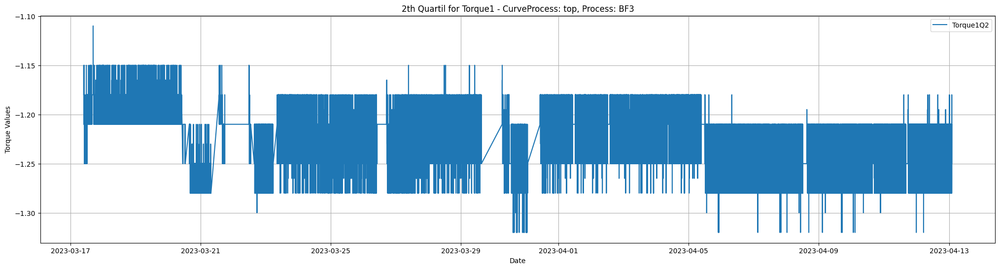

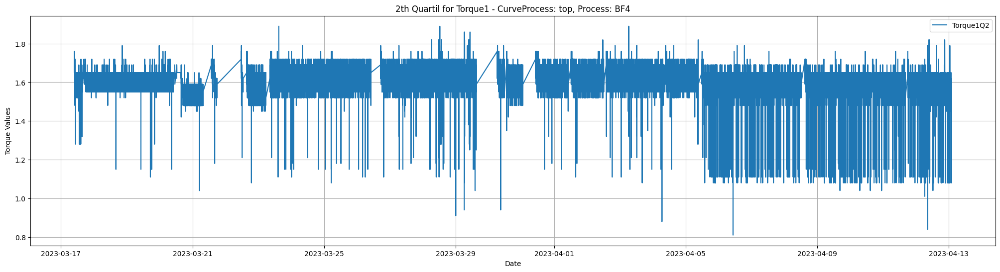

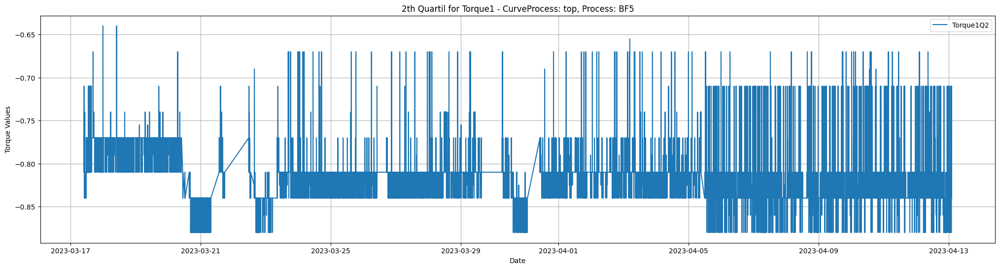

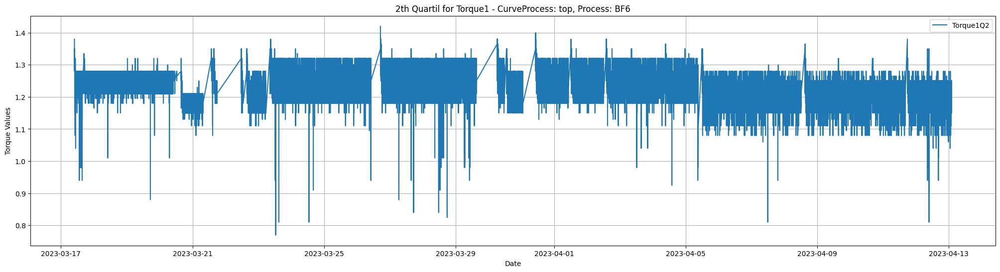

In [ ]:
processes = ['BF1', 'BF2', 'BF3', 'BF4', 'BF5', 'BF6']

for process in processes:
  # Filter data by 'CurveProcess' and 'Process' conditions
  filtered_data = data[(data['CurveProcess'] == 'top') & (data['Process'] == process)]
  filtered_data.reset_index(drop=True, inplace=True)
  # Select the columns to plot
  columns_to_plot = ['Torque1Q2']

  # Plot the selected columns
  plt.figure(figsize=(25, 6))

  # Loop through the columns and plot them
  for column in columns_to_plot:
      plt.plot(filtered_data.Datetime, filtered_data[column], label=column)

  #plt.plot(filtered_data.index, filtered_data['Speed1Q2'], label=column)
  plt.title('2th Quartil for Torque1 - CurveProcess: top, Process: ' + process)
  plt.xlabel('Date')
  plt.ylabel('Torque Values')
  plt.legend()
  plt.grid(True)
  plt.show()


We observe the important variation in BF4 and BF5, therefore we look at them.

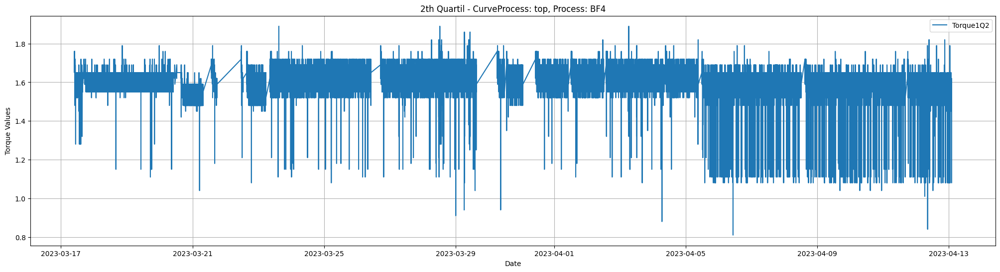

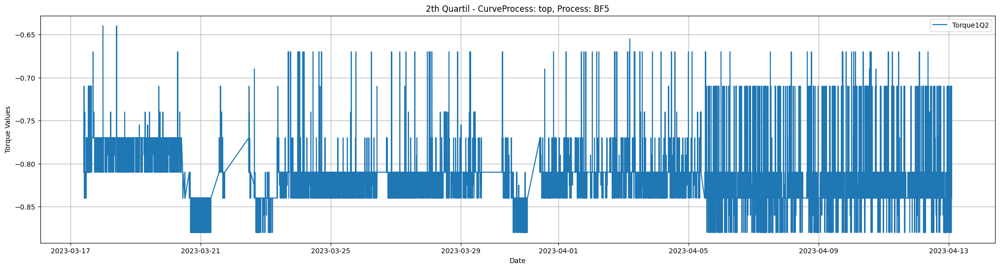

In [ ]:
processes = ['BF4', 'BF5']
for process in processes:
  # Filter data by 'CurveProcess' and 'Process' conditions
  filtered_data = data[(data['CurveProcess'] == 'top') & (data['Process'] == process)]
  filtered_data.reset_index(drop=True, inplace=True)
  # Select the columns to plot
  columns_to_plot = ['Torque1Q2']

  # Plot the selected columns
  plt.figure(figsize=(25, 6))

  # Loop through the columns and plot them
  for column in columns_to_plot:
      plt.plot(filtered_data.Datetime, filtered_data[column], label=column)

  # Calculate and plot the trend line (you can change the degree of the polynomial as needed)
  # trend_line = np.polyfit(filtered_data.index, filtered_data['Torque1Max'], 3)  # Linear trend line
  # trend_values = np.polyval(trend_line, filtered_data.index)
  # plt.plot(filtered_data.Datetime, trend_values, label='Trend Line', linestyle='--', color='red')

  plt.title('2th Quartil - CurveProcess: top, Process: '+ process)
  plt.xlabel('Date')
  plt.ylabel('Torque Values')
  plt.legend()
  plt.grid(True)
  plt.show()


Having a simple visualization, we observe there's an increase of outliers at the end of the motor's life.

#### IsolationForest for anomaly detection

**Background**:<br>
We do not need to split the data into training and test sets when using the **Isolation Forest** algorithm for outlier detection. Isolation Forest is an **unsupervised anomaly detection algorithm**, which means it does not require labeled data for training and testing as traditional supervised machine learning models do.

The Isolation Forest algorithm works by partitioning the dataset into smaller subsets (anomalies are isolated more quickly) and identifying anomalies based on the number of partitions required to isolate a data point. Therefore, it does not need a separate test set for evaluation.

In [ ]:
#filtered_data = filtered_data.drop(columns=['Outlier'])


<ipython-input-56-af451e523313>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data.loc[:,'Outlier'] = outliers


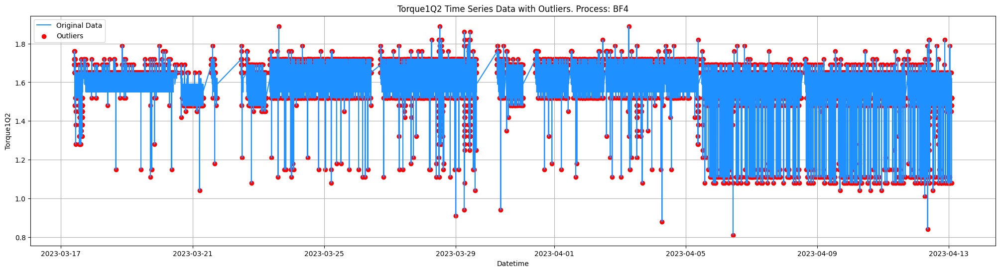

<ipython-input-56-af451e523313>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data.loc[:,'Outlier'] = outliers


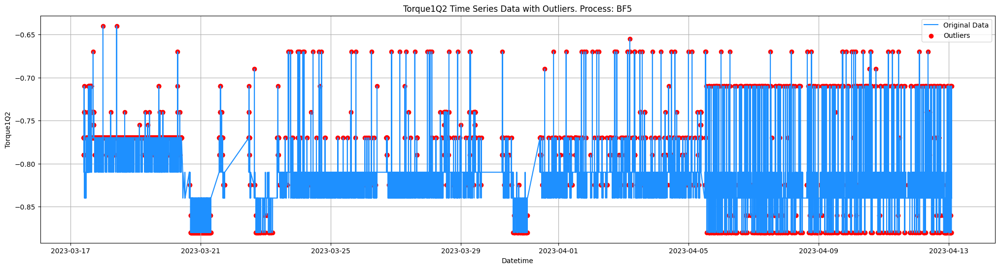

In [ ]:
processes = ['BF4', 'BF5']
for process in processes:
  # Filter data by 'CurveProcess' and 'Process' conditions
  filtered_data = data[(data['CurveProcess'] == 'top') & (data['Process'] == process)]
  filtered_data.reset_index(drop=True, inplace=True)

  # Plot the original time series
  plt.figure(figsize=(25, 6))
  plt.plot(filtered_data['Datetime'], filtered_data['Torque1Q2'], label='Original Data', color='dodgerblue')
  plt.xlabel('Datetime')
  plt.ylabel('Torque1Q2')
  plt.title('Torque1Q2 Time Series Data with Outliers. Process: ' + process)

  # Fit an Isolation Forest model
  model = IsolationForest(contamination='auto')
  model.fit(filtered_data[['Torque1Q2']])

  # Predict outliers
  outliers = model.predict(filtered_data[['Torque1Q2']])
  filtered_data.loc[:,'Outlier'] = outliers

  # Highlight outliers in red
  plt.scatter(filtered_data[filtered_data['Outlier'] == -1]['Datetime'],
              filtered_data[filtered_data['Outlier'] == -1]['Torque1Q2'],
              color='red', label='Outliers')

  plt.legend()
  plt.grid(True)
  plt.show()

#### Linear regression + Thresholds
We can clearly observe a linear trend, therefore a linear regreession will be fit and upper and lower threshold will be applied to determine the outliers.

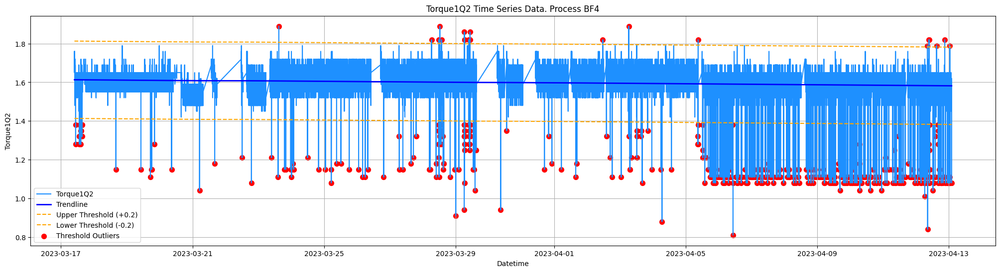

In [ ]:
filtered_data = data[(data['CurveProcess'] == 'top') & (data['Process'] == 'BF4')]
filtered_data.reset_index(drop=True, inplace=True)

# Fit a linear regression model to the data
X = np.arange(len(filtered_data)).reshape(-1, 1)
y = filtered_data['Torque1Q2'].values
regressor = LinearRegression()
regressor.fit(X, y)
y_pred = regressor.predict(X)

# Calculate upper and lower threshold lines
upper_threshold = y_pred + 0.2
lower_threshold = y_pred - 0.2

# Classify outliers based on the thresholds
upper_outliers = filtered_data[filtered_data['Torque1Q2'] > upper_threshold]
lower_outliers = filtered_data[filtered_data['Torque1Q2'] < lower_threshold]
all_outliers = pd.concat([upper_outliers, lower_outliers])

# Plot the 'Torque1Q2' values
plt.figure(figsize=(25, 6))
plt.plot(filtered_data['Datetime'], filtered_data['Torque1Q2'], label='Torque1Q2', color='dodgerblue')
plt.xlabel('Datetime')
plt.ylabel('Torque1Q2')
plt.title('Torque1Q2 Time Series Data. Process BF4')

# Plot the trendline
plt.plot(filtered_data['Datetime'], y_pred, color='blue', linestyle='-', linewidth=2, label='Trendline')

# Plot upper and lower threshold lines
plt.plot(filtered_data['Datetime'], upper_threshold, color='orange', linestyle='--', label='Upper Threshold (+0.2)')
plt.plot(filtered_data['Datetime'], lower_threshold, color='orange', linestyle='--', label='Lower Threshold (-0.2)')

# Mark upper and lower threshold outliers
plt.scatter(all_outliers['Datetime'], all_outliers['Torque1Q2'], color='red', marker='o', s=50, label='Threshold Outliers')

plt.legend()
plt.grid(True)
plt.show()

**Finding:**


*   There's a clear increase of outlier at the end of the motor live



In [ ]:
print('Q_0.01:', filtered_data['Torque1Q2'].quantile(0.01))
print('Q_0.99:', filtered_data['Torque1Q2'].quantile(0.99))
print('Q_0.5:', filtered_data['Torque1Q2'].quantile(0.5))
print('Q_0.5 - Q_0.01:', filtered_data['Torque1Q2'].quantile(0.5)-filtered_data['Torque1Q2'].quantile(0.01))
print('Q_0.5 - Q_0.99:', filtered_data['Torque1Q2'].quantile(0.5)-filtered_data['Torque1Q2'].quantile(0.99))

Q_0.01: 1.5199999809265137
Q_0.99: 1.690000057220459
Q_0.5: 1.590000033378601
Q_0.5 - Q_0.01: 0.0700000524520874
Q_0.5 - Q_0.99: -0.10000002384185791


In [ ]:
filtered_data['Torque1Q2'].describe()

count    258258.000000
mean          1.597481
std           0.046260
min           0.810000
25%           1.590000
50%           1.590000
75%           1.620000
max           1.890000
Name: Torque1Q2, dtype: float64

Let's make a transformation and look at the frequency of these outliers.

In [ ]:
# Create an empty list to store OutlierFrequency values
OutlierFrequency = []

# Iterate through the dataset
for i in range(len(filtered_data)):
    # Consider each sample and its index
    current_sample = filtered_data.iloc[i]
    current_index = current_sample.name

    # Take the last x values (if available)
    x_values=1000
    last_x_samples = filtered_data.iloc[max(0, current_index - (x_values-1)): current_index + 1]

    # Count how many values exceed the upper_threshold or fall below the lower_threshold
    outlet_count = ((last_x_samples['Torque1Q2'] > upper_threshold[current_index]) |
                    (last_x_samples['Torque1Q2'] < lower_threshold[current_index])).sum()

    # Append the count to the OutlierFrequency list
    OutlierFrequency.append(outlet_count)

# Create a new column 'OutlierFrequency' in the dataset
filtered_data.loc[:,'OutlierFrequency'] = OutlierFrequency

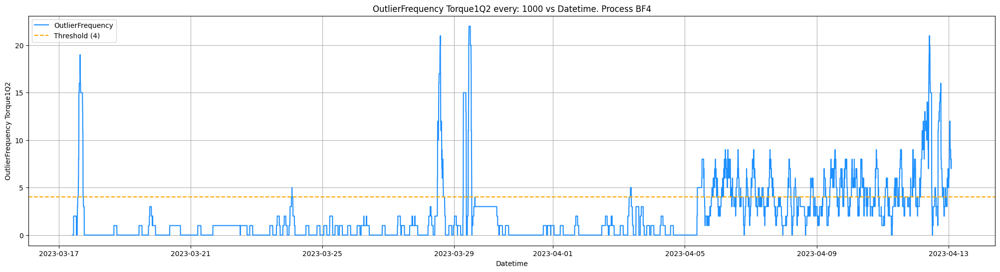

In [ ]:
# Plot 'OutlierFrequency' vs 'Datetime'
plt.figure(figsize=(25, 6))
plt.plot(filtered_data['Datetime'], filtered_data['OutlierFrequency'], label='OutlierFrequency', color='dodgerblue')
plt.axhline(y=4, color='orange', linestyle='--', label='Threshold (4)')
plt.xlabel('Datetime')
plt.ylabel('OutlierFrequency Torque1Q2')
plt.title('OutlierFrequency Torque1Q2 every: '+ str(x_values) + ' vs Datetime. Process BF4')
plt.grid(True)
plt.legend()
plt.show()


**Finding:**


*   We clearly confirm the previous observation: the frequency of outliers for the torque's Q2 increases at the end of the motor's life.

We repeat the last analysis but for the process **BF5**

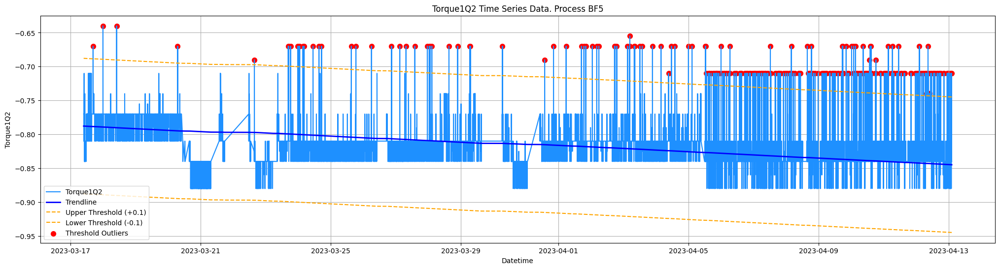

In [ ]:
filtered_data = data[(data['CurveProcess'] == 'top') & (data['Process'] == 'BF5')]
filtered_data.reset_index(drop=True, inplace=True)

# Fit a linear regression model to the data
X = np.arange(len(filtered_data)).reshape(-1, 1)
y = filtered_data['Torque1Q2'].values
regressor = LinearRegression()
regressor.fit(X, y)
y_pred = regressor.predict(X)

# Calculate upper and lower threshold lines
upper_threshold = y_pred + 0.1
lower_threshold = y_pred - 0.1

# Classify outliers based on the thresholds
upper_outliers = filtered_data[filtered_data['Torque1Q2'] > upper_threshold]
lower_outliers = filtered_data[filtered_data['Torque1Q2'] < lower_threshold]
all_outliers = pd.concat([upper_outliers, lower_outliers])

# Plot the 'Torque1Q2' values
plt.figure(figsize=(25, 6))
plt.plot(filtered_data['Datetime'], filtered_data['Torque1Q2'], label='Torque1Q2', color='dodgerblue')
plt.xlabel('Datetime')
plt.ylabel('Torque1Q2')
plt.title('Torque1Q2 Time Series Data. Process BF5')

# Plot the trendline
plt.plot(filtered_data['Datetime'], y_pred, color='blue', linestyle='-', linewidth=2, label='Trendline')

# Plot upper and lower threshold lines
plt.plot(filtered_data['Datetime'], upper_threshold, color='orange', linestyle='--', label='Upper Threshold (+0.1)')
plt.plot(filtered_data['Datetime'], lower_threshold, color='orange', linestyle='--', label='Lower Threshold (-0.1)')

# Mark upper and lower threshold outliers
plt.scatter(all_outliers['Datetime'], all_outliers['Torque1Q2'], color='red', marker='o', s=50, label='Threshold Outliers')

plt.legend(loc='lower left')
plt.grid(True)
plt.show()

In [ ]:
print('Q_0.01:', filtered_data['Torque1Q2'].quantile(0.01))
print('Q_0.99:', filtered_data['Torque1Q2'].quantile(0.99))
print('Q_0.5:', filtered_data['Torque1Q2'].quantile(0.5))
print('Q_0.5 - Q_0.01:', filtered_data['Torque1Q2'].quantile(0.5)-filtered_data['Torque1Q2'].quantile(0.01))
print('Q_0.5 - Q_0.99:', filtered_data['Torque1Q2'].quantile(0.5)-filtered_data['Torque1Q2'].quantile(0.99))

Q_0.01: -0.8399999737739563
Q_0.99: -0.7699999809265137
Q_0.5: -0.8100000023841858
Q_0.5 - Q_0.01: 0.029999971389770508
Q_0.5 - Q_0.99: -0.04000002145767212


In [ ]:
filtered_data['Torque1Q2'].describe()

count    258866.000000
mean         -0.816355
std           0.023315
min          -0.880000
25%          -0.840000
50%          -0.810000
75%          -0.810000
max          -0.640000
Name: Torque1Q2, dtype: float64

To confirm that we'll calculate and plot the frquency of outlets.

Then also for **BF5:**

In [ ]:
filtered_data = data[(data['CurveProcess'] == 'top') & (data['Process'] == 'BF5')]
filtered_data.reset_index(drop=True, inplace=True)
# Create an empty list to store OutlierFrequency values
OutlierFrequency = []

# Iterate through the dataset
for i in range(len(filtered_data)):
    # Consider each sample and its index
    current_sample = filtered_data.iloc[i]
    current_index = current_sample.name

    # Take the last x values (if available)
    x_values=1000
    last_x_samples = filtered_data.iloc[max(0, current_index - (x_values-1)): current_index + 1]

    # Count how many values exceed the upper_threshold or fall below the lower_threshold
    outlet_count = ((last_x_samples['Torque1Q2'] > upper_threshold[current_index]) |
                    (last_x_samples['Torque1Q2'] < lower_threshold[current_index])).sum()

    # Append the count to the OutlierFrequency list
    OutlierFrequency.append(outlet_count)

# Create a new column 'OutlierFrequency' in the dataset
filtered_data.loc[:,'OutlierFrequency'] = OutlierFrequency

<ipython-input-84-a77cb6a13be7>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data.loc[:,'OutlierFrequency'] = OutlierFrequency


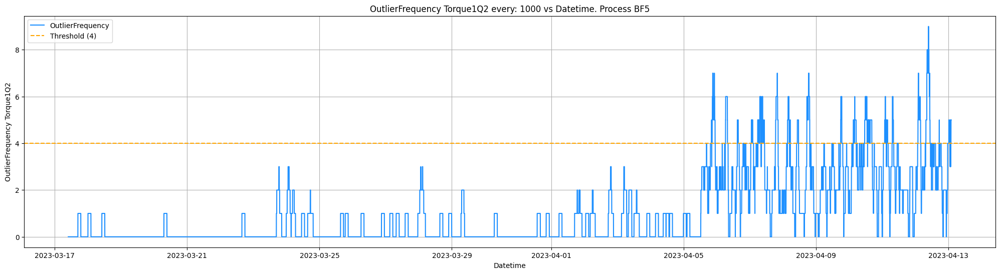

In [ ]:
# Plot 'OutlierFrequency' vs 'Datetime'
plt.figure(figsize=(25, 6))
plt.plot(filtered_data['Datetime'], filtered_data['OutlierFrequency'], label='OutlierFrequency', color='dodgerblue')
plt.axhline(y=4, color='orange', linestyle='--', label='Threshold (4)')
plt.xlabel('Datetime')
plt.ylabel('OutlierFrequency Torque1Q2')
plt.title('OutlierFrequency Torque1Q2 every: '+ str(x_values) + ' vs Datetime. Process BF5')
plt.grid(True)
plt.legend()
plt.show()


**Finding**

*   Transforming the data to just counting the number of Outliers every 1000 values, we can observed how it increase at the end often it becomes specially at the end of the motor life.



Based on time

In [ ]:
#filtered_data = filtered_data.drop('OutletFrequency', axis=1)

In [ ]:
# Create an empty list to store OutletFrequency values
OutletFrequency = []
minutesToCheck = 10

# Iterate through the dataset
for i in range(len(filtered_data)):
    # Consider each sample and its index
    current_datetime = filtered_data.iloc[i]['Datetime']
    x_minutes_ago = current_datetime - pd.Timedelta(minutes=minutesToCheck)

    # Filter the rows within the last 60 minutes
    last_x_minutes = filtered_data[(filtered_data['Datetime'] >= x_minutes_ago) & (filtered_data['Datetime'] <= current_datetime)]

    # Count how many values exceed the upper_threshold or fall below the lower_threshold
    outlet_count = ((last_x_samples['Torque1Q2'] > upper_threshold[current_index]) |
                    (last_x_samples['Torque1Q2'] < lower_threshold[current_index])).sum()/minutesToCheck

    # Append the count to the OutletFrequency list
    OutletFrequency.append(outlet_count)

# Create a new column 'OutletFrequency' in the dataset
filtered_data['OutletFrequency'] = OutletFrequency


<ipython-input-96-c36b127bfe63>:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['OutletFrequency'] = OutletFrequency


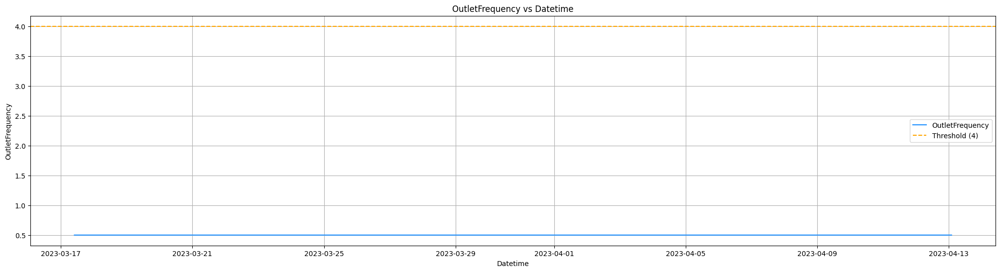

In [ ]:
# Plot 'OutletFrequency' vs 'Datetime'
plt.figure(figsize=(25, 6))
plt.plot(filtered_data['Datetime'], filtered_data['OutletFrequency'], label='OutletFrequency', color='dodgerblue')
plt.axhline(y=4, color='orange', linestyle='--', label='Threshold (4)')

# Mark in red the samples where 'Error' is 1
#error_samples = filtered_data[filtered_data['Error'] == 1]
#plt.scatter(error_samples['Datetime'], error_samples['OutletFrequency'], color='red', marker='o', s=50, label='Error Samples')

plt.xlabel('Datetime')
plt.ylabel('OutletFrequency')
plt.title('OutletFrequency vs Datetime')
plt.grid(True)
plt.legend()
plt.show()

The above didn't work out :(

Let's look at Boxplot, and its information, per day.

<ipython-input-86-c71cb09167cc>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data.loc[:, 'Date'] = filtered_data['Datetime'].dt.date


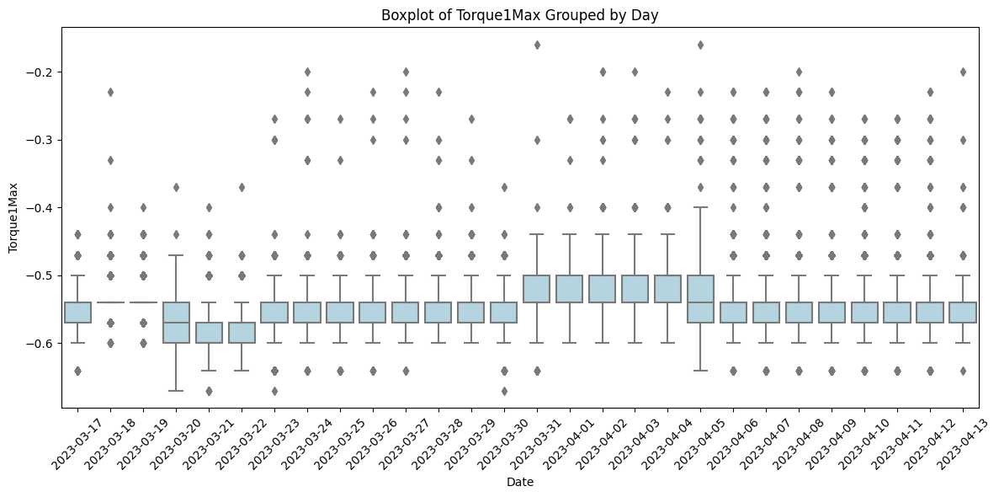

In [ ]:
# Extract the day from the Datetime column
filtered_data.loc[:, 'Date'] = filtered_data['Datetime'].dt.date

# Create a boxplot
plt.figure(figsize=(12, 6))
sns.boxplot(x=filtered_data['Date'], y=filtered_data['Torque1Max'], color='lightblue')
plt.xlabel('Date')
plt.ylabel('Torque1Max')
plt.title('Boxplot of Torque1Max Grouped by Day')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()


No extra knowledge obtain for the last visualization.

Let's apply other algorithms for anomaly detection

#### SVN for anomalies

In [ ]:
# Fit a One-Class SVM model
model = OneClassSVM(nu=0.01)  # Adjust the nu parameter as needed (controls the proportion of outliers)
model.fit(filtered_data[['Torque1Q2']])

# Predict outliers
outliers = model.predict(filtered_data[['Torque1Q2']])
filtered_data['Outlier'] = outliers

<ipython-input-93-3d7ccc1f67b4>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['Outlier'] = outliers


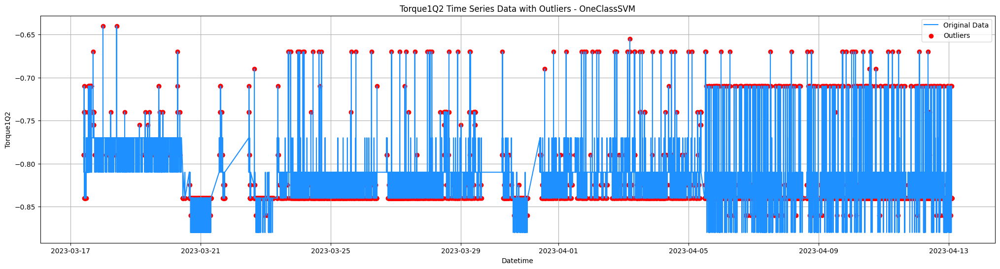

In [ ]:
# Plot the original time series
plt.figure(figsize=(25, 6))
plt.plot(filtered_data['Datetime'], filtered_data['Torque1Q2'], label='Original Data', color='dodgerblue')
plt.xlabel('Datetime')
plt.ylabel('Torque1Q2')
plt.title('Torque1Q2 Time Series Data with Outliers - OneClassSVM')

# Highlight outliers in red
plt.scatter(filtered_data[filtered_data['Outlier'] == -1]['Datetime'],
            filtered_data[filtered_data['Outlier'] == -1]['Torque1Q2'],
            color='red', label='Outliers')

plt.legend()
plt.grid(True)
plt.show()




In [ ]:
# Print the detected outliers
detected_outliers = filtered_data[filtered_data['Outlier'] == -1]
print ("Amount od samples: ", filtered_data.shape[0])
print("Amount of detected Outliers: ", len(detected_outliers) )
print("Detected Outliers:")
print(detected_outliers.Datetime, detected_outliers.Torque1Q2 )

Amount od samples:  258866
Amount of detected Outliers:  100773
Detected Outliers:
96       2023-03-17 10:02:20
112      2023-03-17 10:04:18
116      2023-03-17 10:04:43
118      2023-03-17 10:04:55
124      2023-03-17 10:05:42
                 ...        
258861   2023-04-13 02:03:26
258862   2023-04-13 02:03:32
258863   2023-04-13 02:03:38
258864   2023-04-13 02:03:44
258865   2023-04-13 02:03:50
Name: Datetime, Length: 100773, dtype: datetime64[ns] 96       -0.79
112      -0.79
116      -0.79
118      -0.79
124      -0.79
          ... 
258861   -0.84
258862   -0.84
258863   -0.84
258864   -0.84
258865   -0.84
Name: Torque1Q2, Length: 100773, dtype: float64


**Z-Score**

<ipython-input-96-2bfbba3800a1>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['Z-score'] = (filtered_data['Torque1Max'] - filtered_data['Torque1Mean']) / filtered_data['Torque1Std']
<ipython-input-96-2bfbba3800a1>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['Outlier'] = np.where(np.abs(filtered_data['Z-score']) > z_score_threshold, 1, 0)


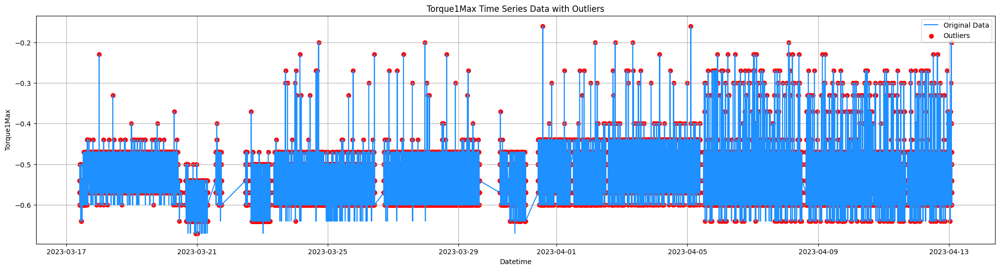

In [ ]:
# Plot the original time series
plt.figure(figsize=(25, 6))
plt.plot(filtered_data['Datetime'], filtered_data['Torque1Max'], label='Original Data', color='dodgerblue')
plt.xlabel('Datetime')
plt.ylabel('Torque1Max')
plt.title('Torque1Max Time Series Data with Outliers')

# Calculate the mean and standard deviation
mean = filtered_data['Torque1Max'].mean()
std_dev = filtered_data['Torque1Max'].std()

# Calculate the Z-score for each data point
#filtered_data['Z-score'] = (filtered_data['Torque1Max'] - mean) / std_dev
filtered_data['Z-score'] = (filtered_data['Torque1Max'] - filtered_data['Torque1Mean']) / filtered_data['Torque1Std']

# Define a Z-score threshold for identifying outliers
z_score_threshold = 2.0  # Adjust as needed based on your desired sensitivity

# Identify outliers based on the Z-score threshold
filtered_data['Outlier'] = np.where(np.abs(filtered_data['Z-score']) > z_score_threshold, 1, 0)

# Highlight outliers in red
plt.scatter(filtered_data[filtered_data['Outlier'] == 1]['Datetime'],
            filtered_data[filtered_data['Outlier'] == 1]['Torque1Max'],
            color='red', label='Outliers')

plt.legend()
plt.grid(True)
plt.show()



In [ ]:
# Set the rolling window size (10 minutes)
window_size = '10m'

# Create a new DataFrame to store the results
result_df = pd.DataFrame(columns=['Datetime', 'Frequency_of_Outliers'])

# Iterate through the data in rolling windows
for i, window_start in enumerate(filtered_data['Datetime']):
    window_end = window_start + pd.to_timedelta(window_size)
    window_data = filtered_data[(filtered_data['Datetime'] >= window_start) & (filtered_data['Datetime'] < window_end)]

    # Calculate the frequency of outliers in the window
    outlier_frequency = window_data['Outlier'].sum() / len(window_data)



    # Append the result to the new DataFrame
    #result_df = result_df.append({'Datetime': window_start, 'Frequency_of_Outliers': outlier_frequency}, ignore_index=True)
    window_result = pd.DataFrame({'Datetime': [window_start], 'Frequency_of_Outliers': [outlier_frequency]})
    result_df = pd.concat([result_df, window_result], ignore_index=True)


# Display the result DataFrame
print(result_df)

                  Datetime  Frequency_of_Outliers
0      2023-03-17 09:49:58               0.949367
1      2023-03-17 09:50:04               0.948718
2      2023-03-17 09:50:10               0.948052
3      2023-03-17 09:50:16               0.948052
4      2023-03-17 09:50:23               0.948052
...                    ...                    ...
258861 2023-04-13 02:03:26               1.000000
258862 2023-04-13 02:03:32               1.000000
258863 2023-04-13 02:03:38               1.000000
258864 2023-04-13 02:03:44               1.000000
258865 2023-04-13 02:03:50               1.000000

[258866 rows x 2 columns]


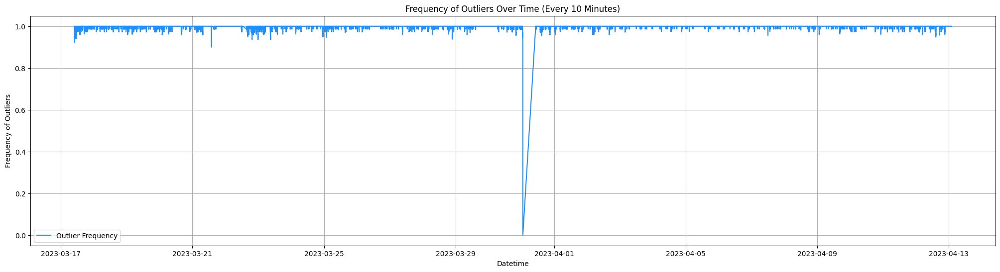

In [ ]:
# Plot the frequency of outliers over time
plt.figure(figsize=(25, 6))
plt.plot(result_df['Datetime'], result_df['Frequency_of_Outliers'], label='Outlier Frequency', color='dodgerblue')
plt.xlabel('Datetime')
plt.ylabel('Frequency of Outliers')
plt.title('Frequency of Outliers Over Time (Every 10 Minutes)')
plt.legend()
plt.grid(True)
plt.show()


**In conclusion:<br>**
the way to go is with linear regression and thresholds using Torque1Q2 data during the processes BF4 and BF5. Then a transformation to count the amount of outliers every 1000 samples show a clear result.